In [2]:
import numpy as np
import os
import h5py
from getdist import plots, MCSamples
import getdist
import dynesty 
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc
import pickle

import matplotlib
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
textsize = 'x-large'
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (6, 4),
         'axes.labelsize': textsize,
         'axes.titlesize': textsize,
         'xtick.labelsize': textsize,
         'ytick.labelsize': textsize,
         'figure.facecolor': 'w'}
pylab.rcParams.update(params)
from matplotlib import pyplot as plt

%load_ext autoreload
%autoreload 2
import plotter
import utils
import emulator

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
pickle_dir = f'../products/dynesty_results'

In [4]:
cosmo_params = ['Omega_m', 'Omega_b', 'sigma_8', 'h', 'n_s', 'N_eff', 'w']
hod_params = ['M_sat', 'alpha', 'M_cut', 'sigma_logM', 'v_bc', 'v_bs', 'c_vir', 'f']
ab_params = ['f_env', 'delta_env', 'sigma_env']
hod_interest = ['M_sat', 'M_cut', 'alpha', 'f_env', 'delta_env']
all_interest = ['Omega_m', 'sigma_8', 'M_sat', 'f_env', 'delta_env']
key_params = ['Omega_m', 'sigma_8', 'M_sat', 'v_bc', 'v_bs', 'f', 'f_env']
all_params = ['Omega_m', 'Omega_b', 'sigma_8', 'h', 'n_s', 'N_eff', 'w', 'M_sat', 'alpha', 'M_cut', 'sigma_logM', 'v_bc', 'v_bs', 'c_vir', 'f', 'f_env', 'delta_env', 'sigma_env']
bi_params = ['Omega_b', 'sigma_8', 'h', 'w', 'delta_env']
biplus_params = ['Omega_m', 'Omega_b', 'sigma_8', 'h', 'w', 'M_sat', 'delta_env']

In [5]:
cwp = 'deepskyblue'
cupf = 'green'
cmcf = 'magenta'

In [6]:
param_labels = {'Omega_m': '\Omega_m', 
                'Omega_b': '\Omega_b', 
                'sigma_8': '\sigma_8', 
                'h': 'h', 
                'n_s': 'n_s',
                'N_eff': 'N_{eff}', 
                'w': 'w', 
                'M_sat': 'M_{sat}', 
                'alpha': r'\alpha', 
                'M_cut': 'M_{cut}', 
                'sigma_logM': '\sigma_{logM}', 
                'v_bc': 'v_{bc}', 
                'v_bs': 'v_{bs}', 
                'c_vir': 'c_{vir}', 
                'f': 'f', 
                'f_env': 'f_{env}', 
                'delta_env': '\delta_{env}', 
                'sigma_env': '\sigma_{env}'}

In [7]:
nbins = 9
rbins = np.logspace(np.log10(0.1), np.log10(50), nbins + 1) # Note the + 1 to nbins
rlog = 10 ** (0.5 * (np.log10(rbins)[1:] + np.log10(rbins)[:-1]))
rlin = np.linspace(5, 45, 9)
r_dict = {'wp': rlog, 'xi': rlog, 'upf': rlin, 'mcf': rlog}
scale_dict = {'wp': ('log', 'log'), 'xi': ('log', 'log'), 'upf': ('linear', 'log'), 'mcf': ('log', 'linear')} #x, y

In [8]:
bounds = utils.get_emulator_bounds()

In [9]:
def plot_contours_dynesty(chaintags, legend_labels=None, params_toplot=None, colors=None, 
                  legend_loc='upper center', legend_fontsize=20, 
                  vertical_markers=None, vertical_marker_color='grey'): 
    
    sample_arr = []
    for i, chaintag in enumerate(chaintags):

        chain_fn = f'../chains/chains_{chaintag}.h5'
        fw = h5py.File(chain_fn, 'r')
        param_names = fw.attrs['param_names']
        if vertical_markers is None:
            vertical_markers_toplot = fw.attrs['true_values']
        else:
            vertical_markers_toplot = vertical_markers
        fw.close()
        
        pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
        with open(pickle_fn, 'rb') as pf:
            res = pickle.load(pf)
            samples = res['samples']
            lnweight = np.array(res['logwt'])
            lnevidence = np.array(res['logz'])

        if params_toplot is not None:    
            idxs = []
            for pm in params_toplot:
                idxs.append(np.where(param_names == pm))
            idxs = np.array(idxs).flatten()
            samples = samples[:,idxs]
            param_names = params_toplot
            vertical_markers_toplot = vertical_markers_toplot[idxs]
        
        labels = [param_labels[pn] for pn in param_names]
        ranges = [bounds[pn] for pn in param_names]

        #[-1] bc just care about final evidence value
        weights = np.exp(lnweight - lnevidence[-1]) 
        weights = weights.flatten()

        samps = MCSamples(names=param_names, labels=labels)
        samps.setSamples(samples, weights=weights)
        sample_arr.append(samps)

    marker_args = {'color': vertical_marker_color}
        
    g = plots.get_subplot_plotter()
    g.settings.alpha_filled_add=0.4
    g.settings.figure_legend_frame = False
    g.settings.legend_fontsize = legend_fontsize
    g.settings.axis_marker_lw = 1.0
    g.settings.axis_marker_color = 'dimgrey'
    g.triangle_plot(sample_arr, filled=True, contour_colors=colors, names=param_names,
                   legend_labels=legend_labels, markers=vertical_markers_toplot, title_limit=1, legend_loc=legend_loc,
                    marker_args=marker_args, axis_marker_color='red')
    return g

## plot fits

dict_keys(['nlive', 'niter', 'ncall', 'eff', 'samples', 'samples_id', 'samples_it', 'samples_u', 'logwt', 'logl', 'logvol', 'logz', 'logzerr', 'information', 'bound', 'bound_iter', 'samples_bound', 'scale'])


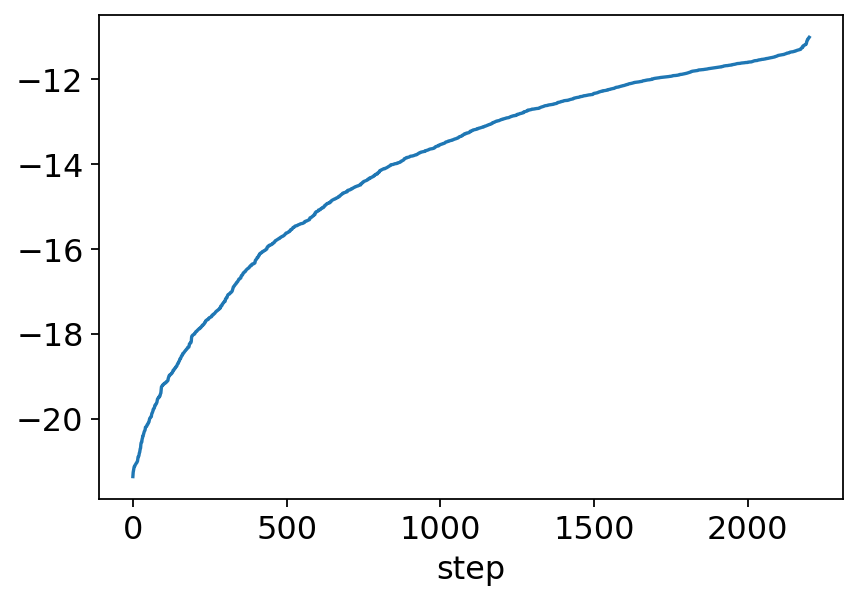

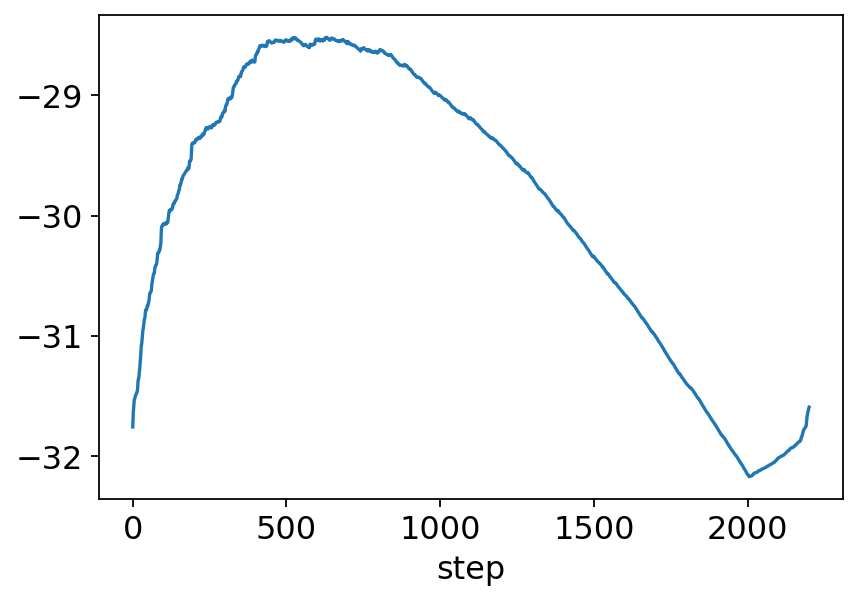

In [157]:
chaintag = 'wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
with open(pickle_fn, 'rb') as pf:
    res = pickle.load(pf)
    samples = res['samples']
    logl = res['logl']
    print(res.keys())
    
    #plt.plot(-logl)
    #plt.yscale('log')
    plt.figure()
    plt.plot(logl[1000:])
    plt.xlabel("step")
    plt.ylabel("")
    
    plt.figure()
    plt.plot(res['logwt'][1000:])
    plt.xlabel("step")
    plt.ylabel("")

In [10]:
def build_emus(f):
    
    #chain_fn = f'../chains/chains_{chaintag}.h5'
    #f = h5py.File(chain_fn, 'r')
    
    ### data params
    cosmo = f.attrs['cosmo']
    hod = f.attrs['hod']
    
    ### emu params
    statistics = f.attrs['statistic']
    traintags = f.attrs['traintag']
    testtags = f.attrs['testtag']
    errtags = f.attrs['errtag']
    tags = f.attrs['tag']
    kernel_names = f.attrs['kernel_name']
    logs = f.attrs['log']
    means = f.attrs['mean']
    nhods = f.attrs['nhod']

    ### chain params
    param_names = f.attrs['param_names']
    
    # Set file and directory names
    nstats = len(statistics)
    training_dirs = [None]*nstats
    testing_dirs = [None]*nstats
    hyperparams = [None]*nstats
    acctags = [None]*nstats
    gperrs = [None]*nstats
    ys = []
    cov_dir = '../../clust/covariances/'
    for i, statistic in enumerate(statistics):
        gptag = traintags[i] + errtags[i] + tags[i]
        acctags[i] = gptag + testtags[i]
        res_dir = '../../clust/results_{}/'.format(statistic)
        gperrs[i] = np.loadtxt(cov_dir+"error_aemulus_{}{}.dat".format(statistic, errtags[i]))
        training_dirs[i] = '{}training_{}{}/'.format(res_dir, statistic, traintags[i])
        testing_dirs[i] = '{}testing_{}{}/'.format(res_dir, statistic, testtags[i])
        hyperparams[i] = "../training_results/{}_training_results{}.dat".format(statistic, gptag)
    
    # number of parameters, out of 11 hod + 7 cosmo
    num_params = len(param_names)
    cosmo_names = ['Omega_m', 'Omega_b', 'sigma_8', 'h', 'n_s', 'N_eff', 'w']
    cosmos_truth = np.loadtxt('../tables/cosmology_camb_test_box_full.dat')

    hod_names = ['M_sat', 'alpha', 'M_cut', 'sigma_logM', 'v_bc', 'v_bs', 'c_vir', 'f', 'f_env', 'delta_env', 'sigma_env']
    hods_truth = np.loadtxt('../tables/HOD_test_np11_n1000_new_f_env.dat')
    hods_truth[:, 0] = np.log10(hods_truth[:, 0])
    hods_truth[:, 2] = np.log10(hods_truth[:, 2])

    fixed_params = {}
    cosmo_truth = cosmos_truth[cosmo]
    hod_truth = hods_truth[hod]
    for (cn, ct) in zip(cosmo_names, cosmo_truth):
        fixed_params[cn] = ct
    for (hn, ht) in zip(hod_names, hod_truth):
        fixed_params[hn] = ht

    # remove params that we want to vary from fixed param dict and add true values
    truths = f.attrs['true_values']
    for pn in param_names:
        fixed_params.pop(pn)
        
    print("Building emulators")
    emus = [None]*nstats
    for i, statistic in enumerate(statistics):
        print(f"Rebuilding emulator for {statistic}")
        emu = emulator.Emulator(statistic, training_dirs[i], testing_dir=testing_dirs[i], fixed_params=fixed_params, 
                                gperr=gperrs[i], hyperparams=hyperparams[i], log=logs[i], 
                                mean=means[i], nhod=nhods[i], kernel_name=kernel_names[i])
        emu.build()
        emus[i] = emu
        
        
    #return emus, statistics, param_names, fixed_params, truths, cosmo, hod
    return emus, fixed_params, gperrs

In [11]:
def get_maxweight_params(res):
    samples = res['samples']
    weights = res['logwt']
    argmax_weight = np.argmax(weights)
    maxweight_params = samples[argmax_weight]
    return maxweight_params

In [12]:
def get_minlogl_params(res, index=-1):
    samples = res['samples']
    minlogl_params = samples[index]
    return minlogl_params

In [13]:
def get_mean_params(res):
    samples, weights = res.samples, np.exp(res.logwt - res.logz[-1])
    mean, cov = dyfunc.mean_and_cov(samples, weights)
    return mean

In [14]:
def get_emu_predictions(emu, params_topredict, param_names, fixed_params):
    param_dict_pred = dict(zip(param_names, params_topredict))
    param_dict_pred.update(fixed_params)
    emu_preds = emu.predict(param_dict_pred)
    return emu_preds

In [15]:
def load_res(chaintag):
    pickle_fn = f'{pickle_dir}/results_{chaintag}.pkl'
    with open(pickle_fn, 'rb') as pf:
        res = pickle.load(pf)
    return res

In [16]:
def get_true_params(chaintag):
    chain_fn = f'../chains/chains_{chaintag}.h5'
    f = h5py.File(chain_fn, 'r')
    truths = f.attrs['true_values']
    return truths

In [17]:
def get_fits(chaintag, param_arr):
    
    chain_fn = f'../chains/chains_{chaintag}.h5'
    f = h5py.File(chain_fn, 'r')
    
    param_names = f.attrs['param_names']
    statistics = f.attrs['statistic']
    cosmo = f.attrs['cosmo']
    hod = f.attrs['hod']
    
    emus, fixed_params, gperrs = build_emus(f)
    
    vals_arr_all = []
    vals_true_all = []

    for i, statistic in enumerate(statistics):
        vals_arr = []
        for params in param_arr:
            vals_arr.append(get_emu_predictions(emus[i], params, param_names, fixed_params))
        
        vals_arr_all.append(vals_arr)
        vals_true_all.append(emus[i].testing_data[(cosmo, hod)])

    return statistics, np.array(vals_arr_all), np.array(vals_true_all), gperrs

In [18]:
def plot_fits(statistics, vals_arr_all, vals_true_all, gperrs, fit_labels, fit_colors, title=''):
    lss = ['-', '--', ':', '-.']
    vals_arr_all = np.array(vals_arr_all)
    vals_true_all = np.array(vals_true_all)
    
    for i, statistic in enumerate(statistics):
        fig, axarr = plt.subplots(2, 1, figsize=(7,7), sharex=True)
        plt.subplots_adjust(hspace=0, wspace=0)
        ax0, ax1 = axarr
        
        
        ax0.plot(r_dict[statistic], vals_true_all[i], label='Truth', marker='o', ls='None', color='black')
        #ax0.errorbar(r_dict[statistic], vals_true_all[i], yerr=10*gperrs[i]*vals_true_all[i], #fmt='o')
        #             label='Truth', ls='None', color='black')
        
        
        
        for j in range(vals_arr_all.shape[1]):
            ax0.plot(r_dict[statistic], vals_arr_all[i][j], label=fit_labels[j], ls=lss[j], color=fit_colors[j])
            frac = (vals_arr_all[i][j] - vals_true_all[i])/vals_true_all[i]
            #frac = (vals_arr_all[i][j] - vals_true_all[i])/(gperrs[i]*vals_true_all[i])
            ax1.plot(r_dict[statistic], frac, label=fit_labels[j], ls=lss[j], color=fit_colors[j])
            
        # dummy to get this into legend
        ax0.plot(0, 0, ls='-', marker='None', label='Aemulus 1-box sample variance', color='plum')
        ax1.plot(r_dict[statistic], gperrs[i], label='Aemulus 1-box sample variance', ls='-', color='plum')
        
            
        ax0.set_xscale(scale_dict[statistic][0])
        ax0.set_yscale(scale_dict[statistic][1])
        ax0.set_ylabel(statistic)
        ax0.legend(fontsize=10, loc='best')
        
        ax1.axhline(0, color='darkgrey')
        ax1.set_xscale(scale_dict[statistic][0])
        ax1.set_xlabel(r"$r$")
        ax1.set_ylabel("fractional error")
        
        #ax0.title(title)

In [19]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params1 = get_minlogl_params(res, index=-1)
minlogl_params19 = get_minlogl_params(res, index=-19)
mean_params = get_mean_params(res)
true_params = get_true_params(chaintag)
param_arr = [true_params, mean_params, minlogl_params1, minlogl_params19]
statistics, vals_arr_all, vals_true_all, gperrs = get_fits(chaintag, param_arr)

Building emulators
Rebuilding emulator for wp


KeyboardInterrupt: 

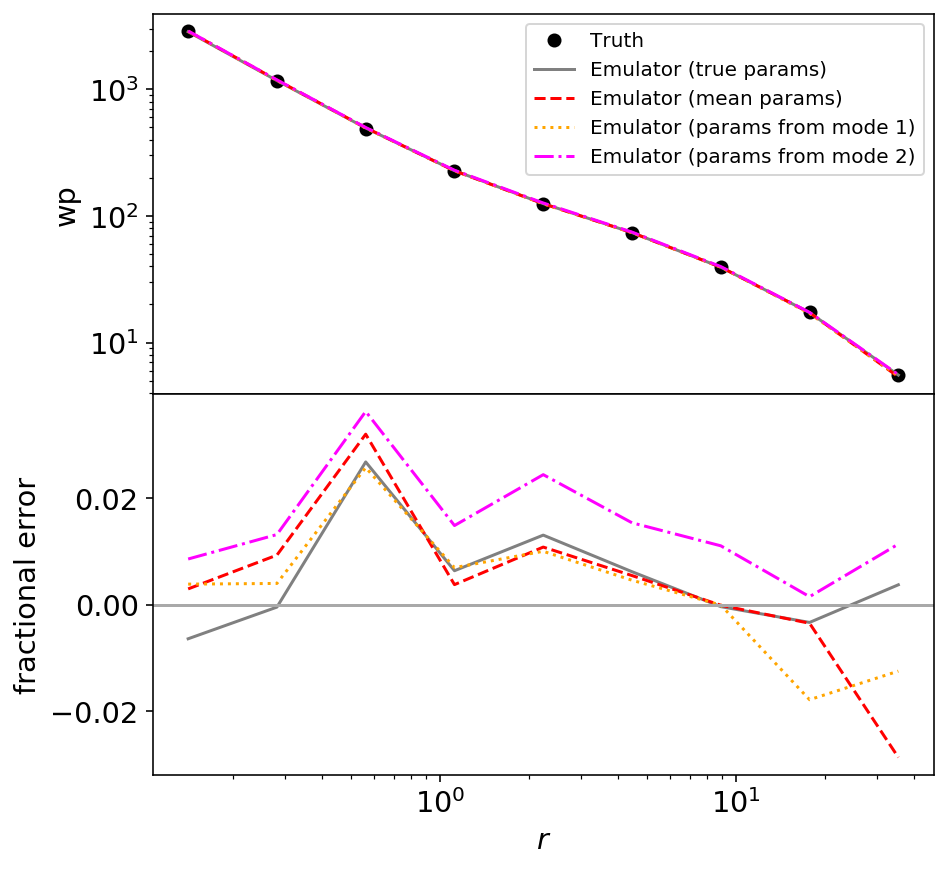

In [52]:
fit_labels = ['Emulator (true params)', 'Emulator (mean params)', 
              'Emulator (params from mode 1)', 'Emulator (params from mode 2)']
fit_colors = ['grey', 'red', 'orange', 'magenta']
plot_fits(statistics, vals_arr_all, vals_true_all, fit_labels, fit_colors, title=chaintag)

[0.01156016 0.01472741 0.01710767 0.01299131 0.0093331  0.00991669
 0.01256808 0.02101721 0.05011567]
[2861.2744    1171.0072     481.59148    226.24992    123.5163
   73.42277     39.406038    17.304958     5.5218626]
[33.07678431 17.24590792  8.23890954  2.93928338  1.15278993  0.72811089
  0.4952584   0.36370198  0.27673185]


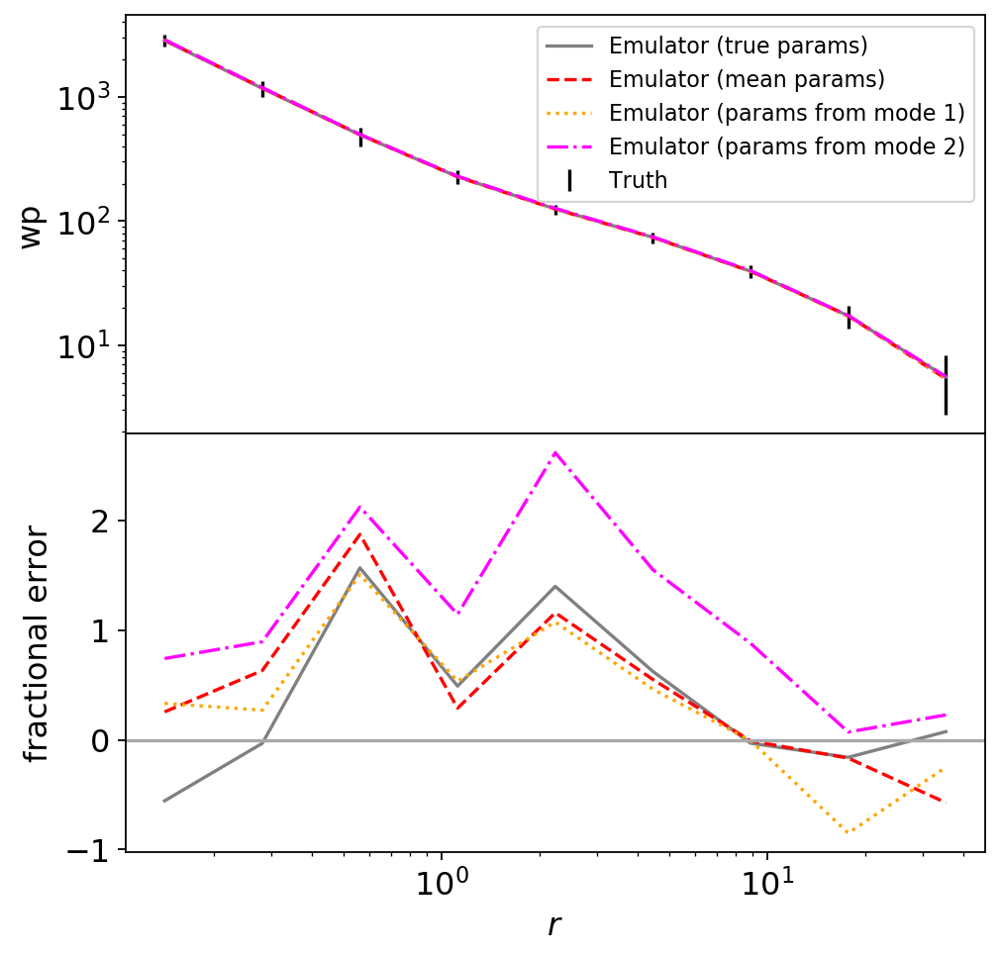

In [70]:
fit_labels = ['Emulator (true params)', 'Emulator (mean params)', 
              'Emulator (params from mode 1)', 'Emulator (params from mode 2)']
fit_colors = ['grey', 'red', 'orange', 'magenta']
plot_fits(statistics, vals_arr_all, vals_true_all, gperrs, fit_labels, fit_colors, title=chaintag)

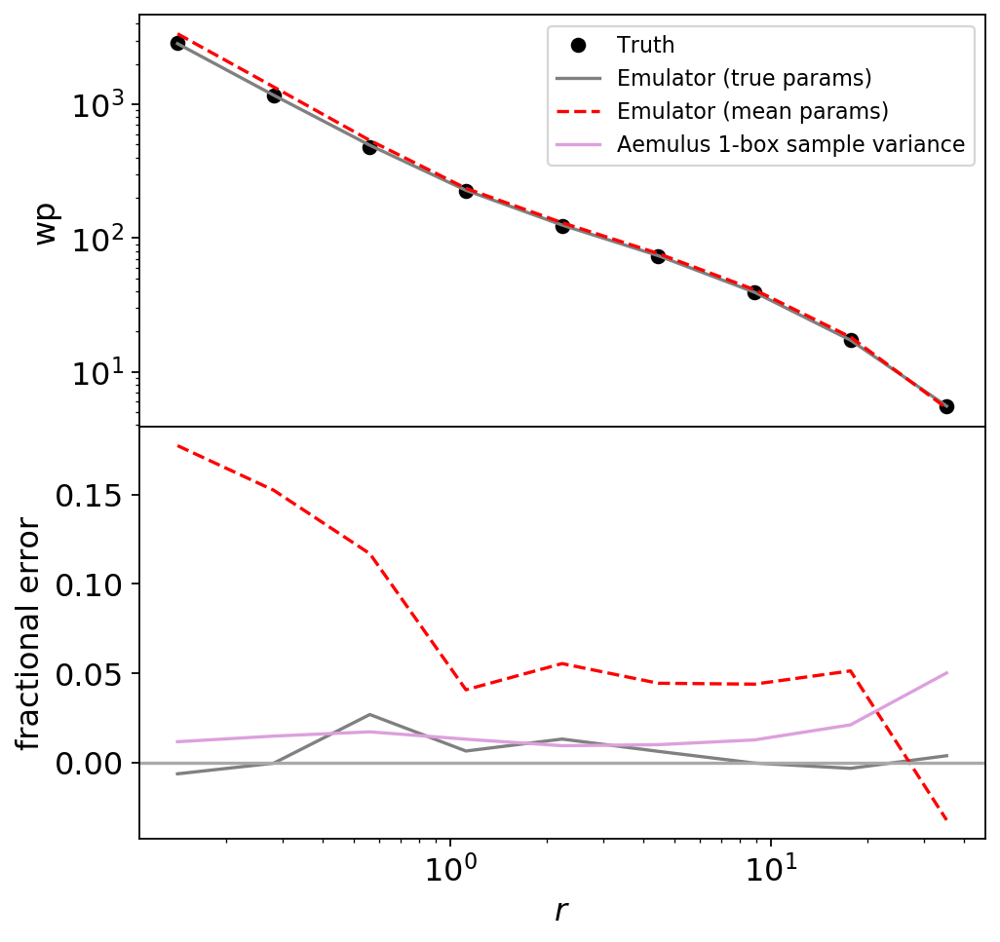

In [93]:
fit_labels = ['Emulator (true params)', 'Emulator (mean params)', 
              'Emulator (params from mode 1)', 'Emulator (params from mode 2)']
fit_colors = ['grey', 'red', 'orange', 'magenta']
plot_fits(statistics, vals_arr_all, vals_true_all, gperrs, fit_labels, fit_colors, title=chaintag)

AttributeError: 'AxesSubplot' object has no attribute 'add_x_marker'

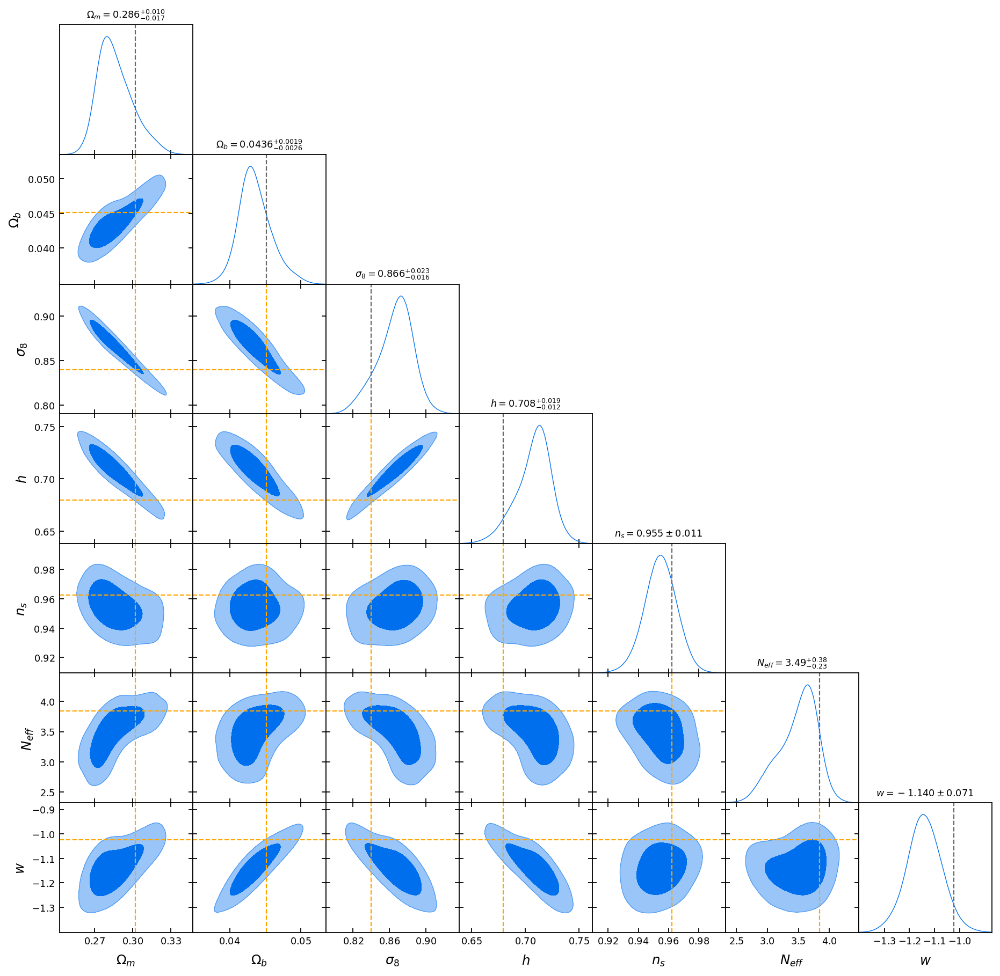

In [163]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params1 = get_minlogl_params(res, index=-1)
g = plot_contours_dynesty([chaintag], params_toplot=cosmo_params, 
                      vertical_markers=minlogl_params1, vertical_marker_color='orange')

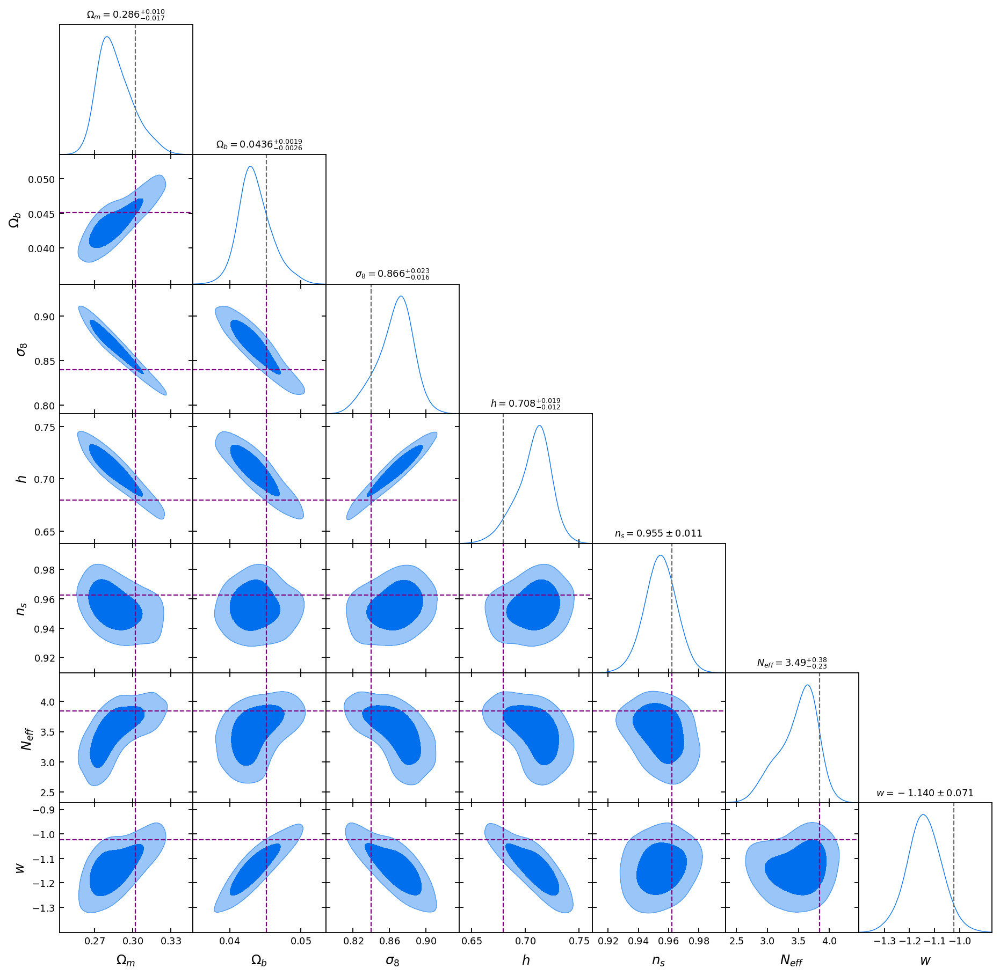

In [167]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params2 = get_minlogl_params(res, index=-2)
g = plot_contours_dynesty([chaintag], params_toplot=cosmo_params, 
                      vertical_markers=minlogl_params1, vertical_marker_color='purple')

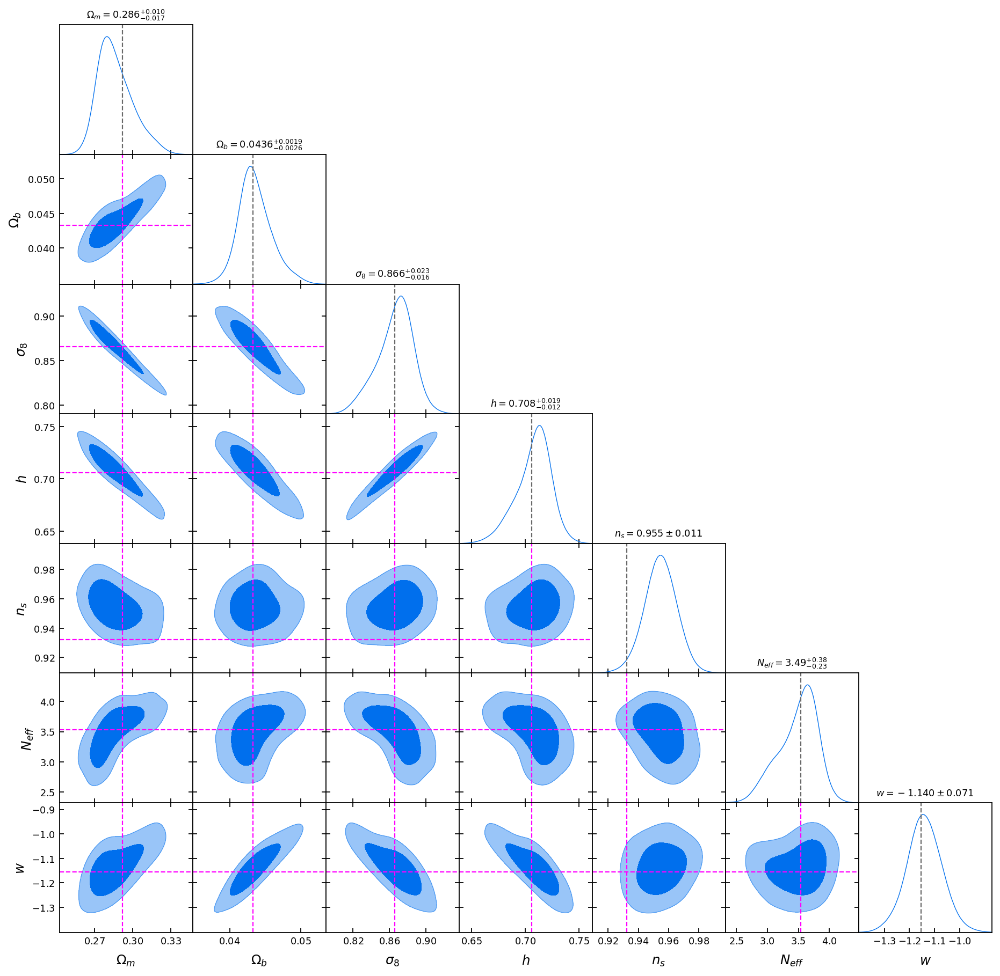

In [165]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
maxweight_params = get_maxweight_params(res)
plot_contours_dynesty([chaintag], params_toplot=cosmo_params, 
                      vertical_markers=maxweight_params, vertical_marker_color='magenta')

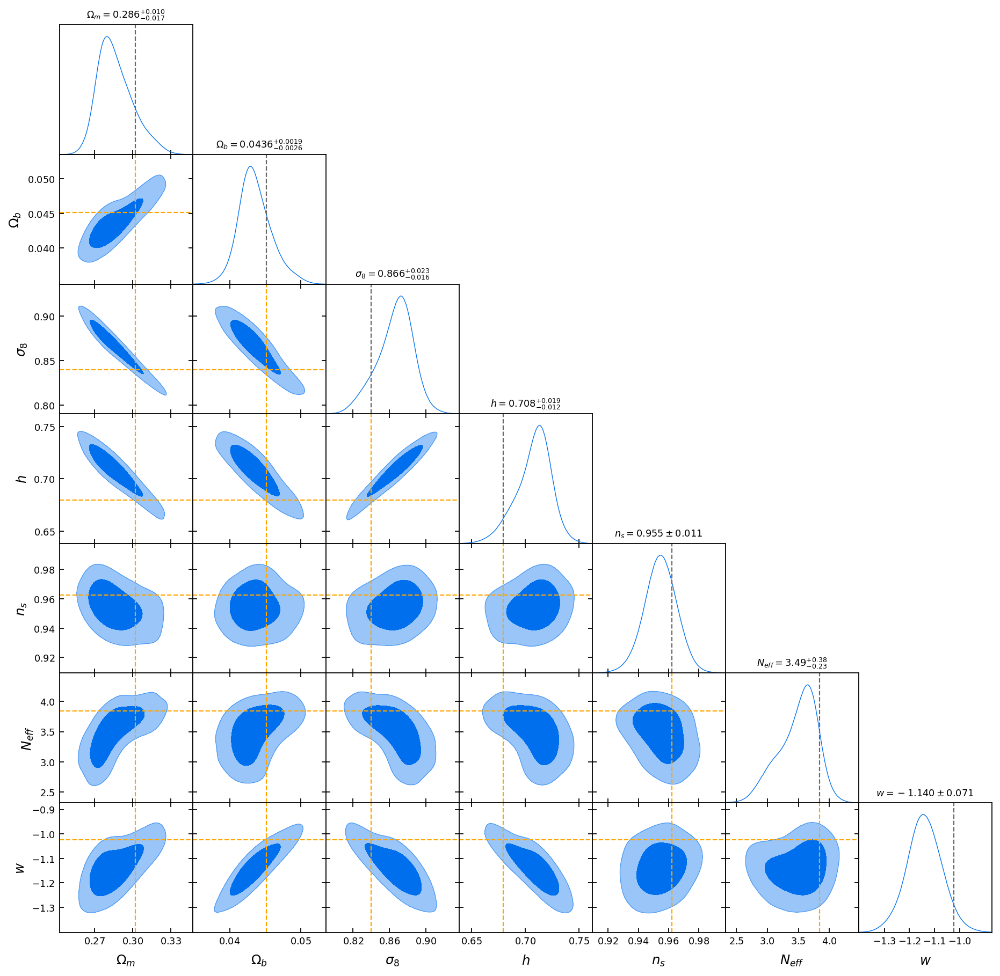

In [151]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params = get_minlogl_params(res, index=-1)
#mean_params = get_mean_posterior(res)
plot_contours_dynesty([chaintag], params_toplot=cosmo_params, 
                      vertical_markers=minlogl_params, vertical_marker_color='orange')

Building emulators
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for wp built


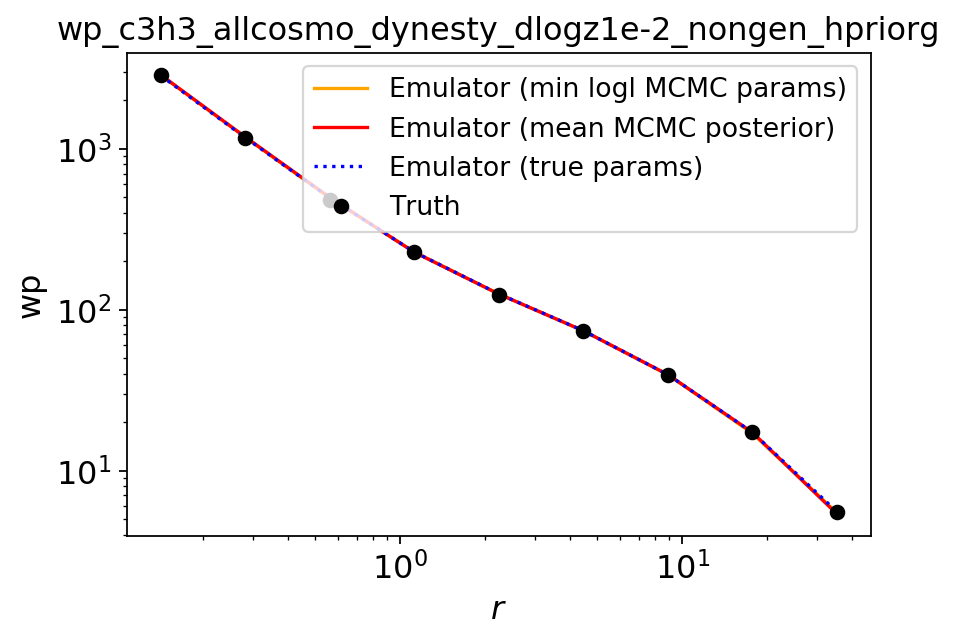

In [149]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
fits = get_fits(chaintag)
plot_fits(*fits, title=chaintag)

Building emulators
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for wp built


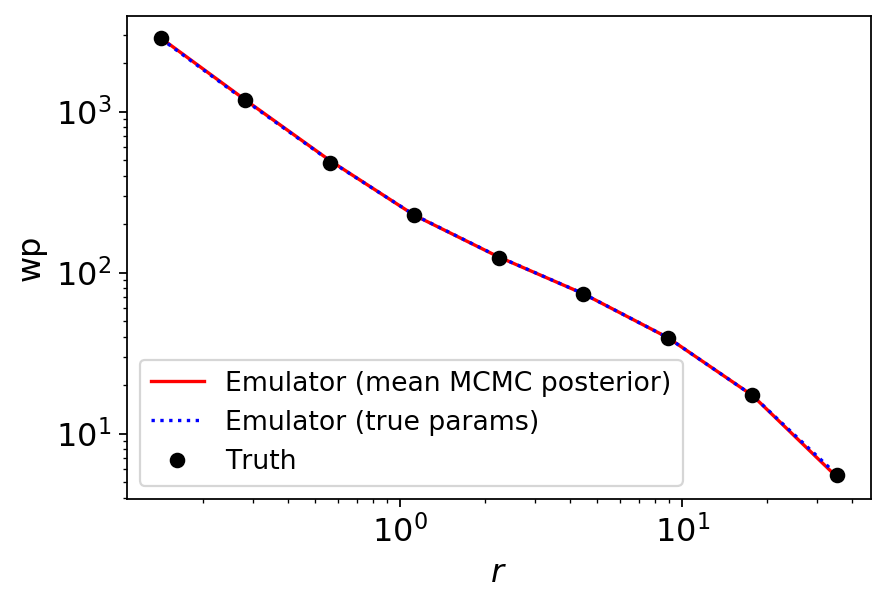

In [84]:
chaintag = 'wp_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
statistics, vals_pred_best, vals_pred_true, vals_actual = get_fits(chaintag)
plot_fits(statistics, vals_pred_best, vals_pred_true, vals_actual, title=chaintag)

Building emulators
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for wp built


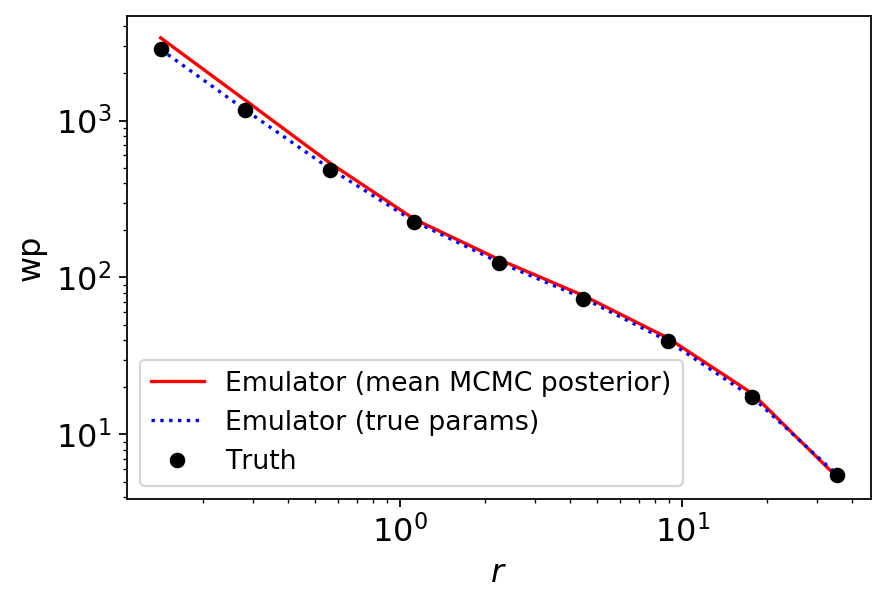

In [85]:
chaintag = 'wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
statistics, vals_pred_best, vals_pred_true, vals_actual = get_fits(chaintag)
plot_fits(statistics, vals_pred_best, vals_pred_true, vals_actual, title=chaintag)

Building emulators
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for wp built
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for xi built
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for upf built
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for mcf built


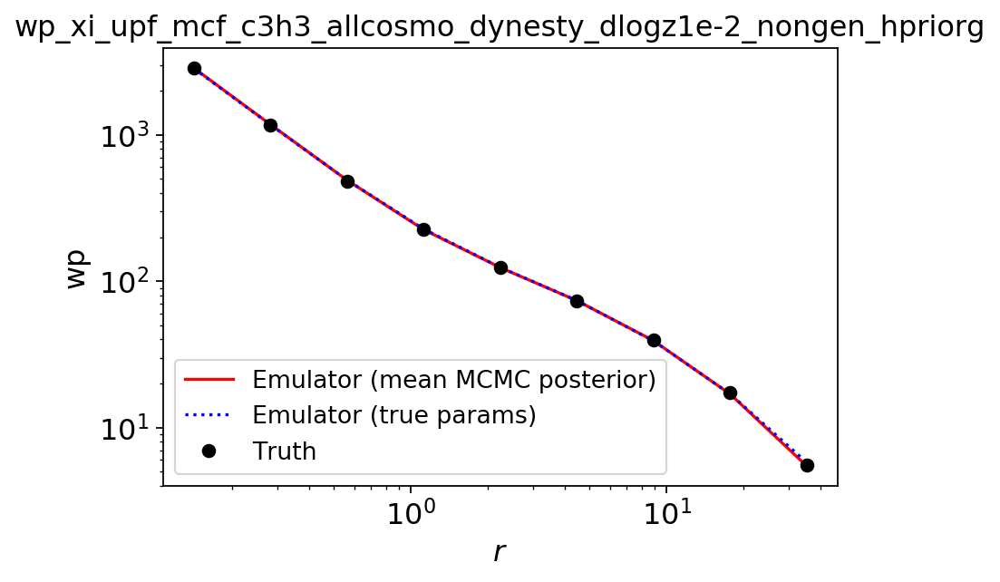

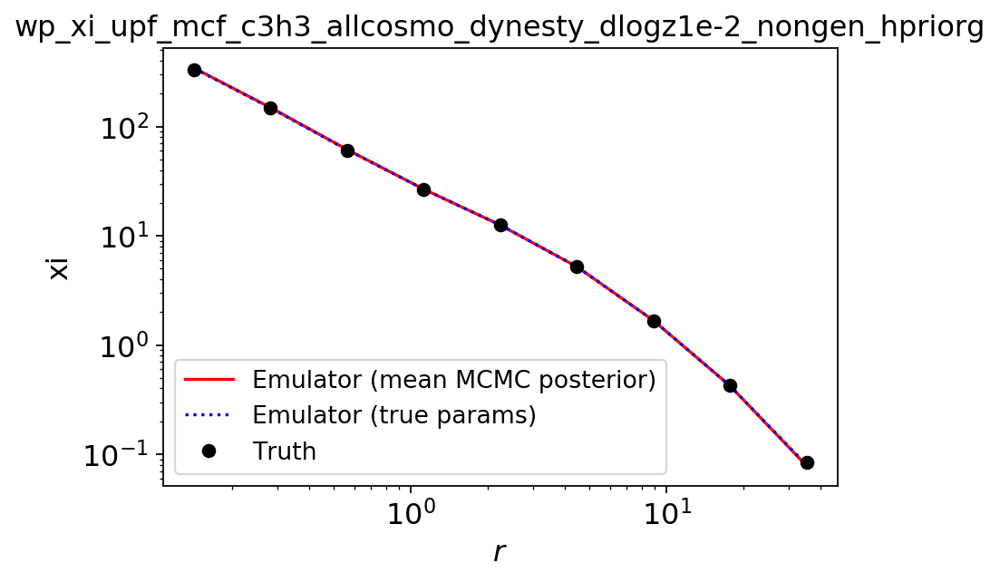

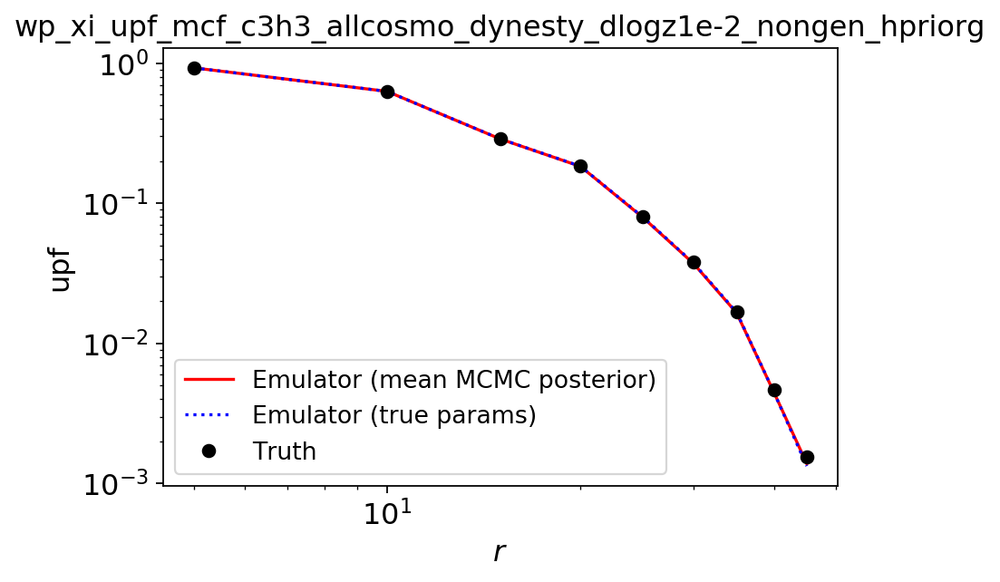

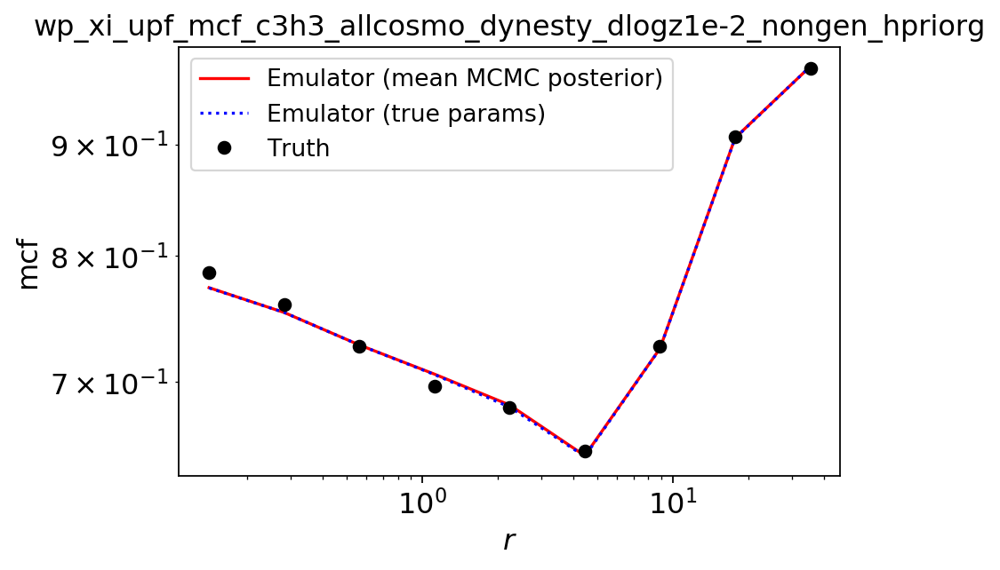

In [91]:
chaintag = 'wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
statistics, vals_pred_best, vals_pred_true, vals_actual = get_fits(chaintag)
plot_fits(statistics, vals_pred_best, vals_pred_true, vals_actual, title=chaintag)

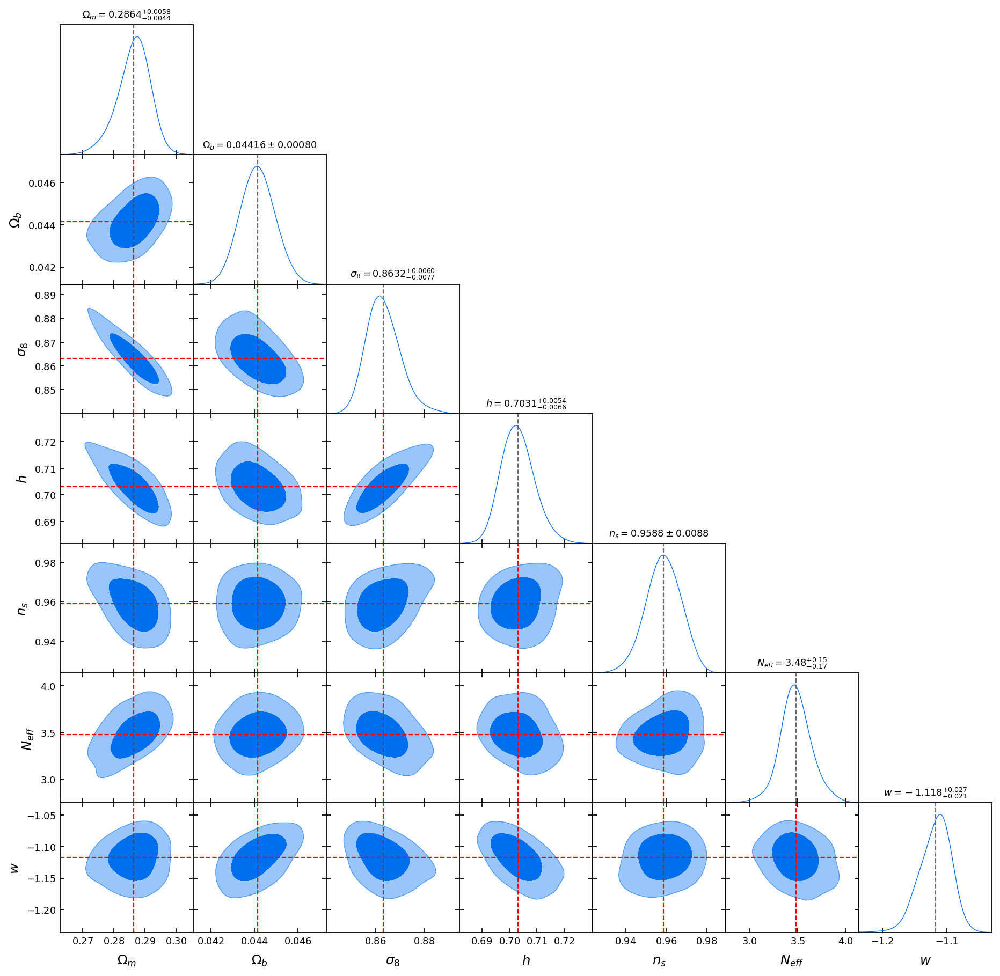

In [110]:
chaintag = 'wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
final_params = get_final_params(res)
mean_params = get_mean_posterior(res)
plot_contours_dynesty([chaintag], vertical_markers=mean_params)

In [112]:
print(mean_params)
chain_fn = f'../chains/chains_{chaintag}.h5'
fw = h5py.File(chain_fn, 'r')
print(fw.attrs['true_values'])
fw.close()

[ 0.28641261  0.0441555   0.86323397  0.70311264  0.95882229  3.48129814
 -1.11756982]
[ 0.289014   0.0434999  0.859613   0.707317   0.953515   3.7
 -1.13151  ]


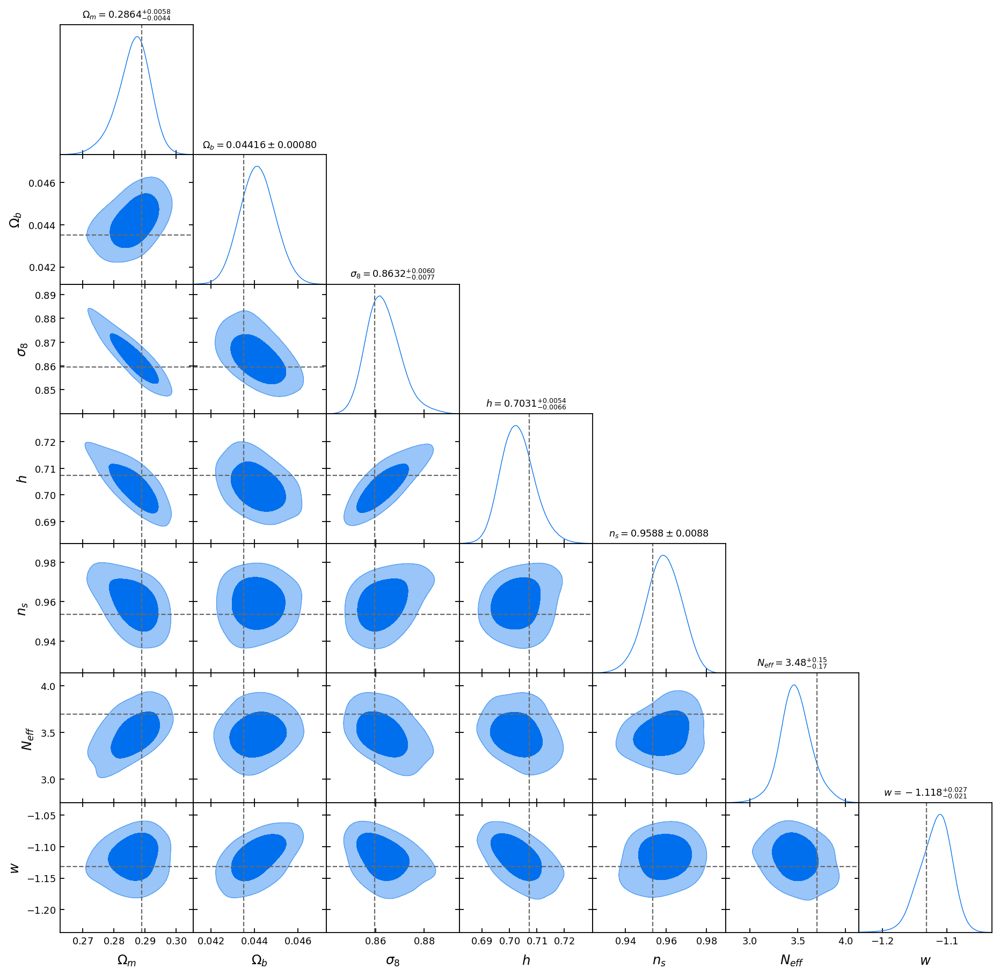

In [103]:
plot_contours_dynesty(['wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg'])

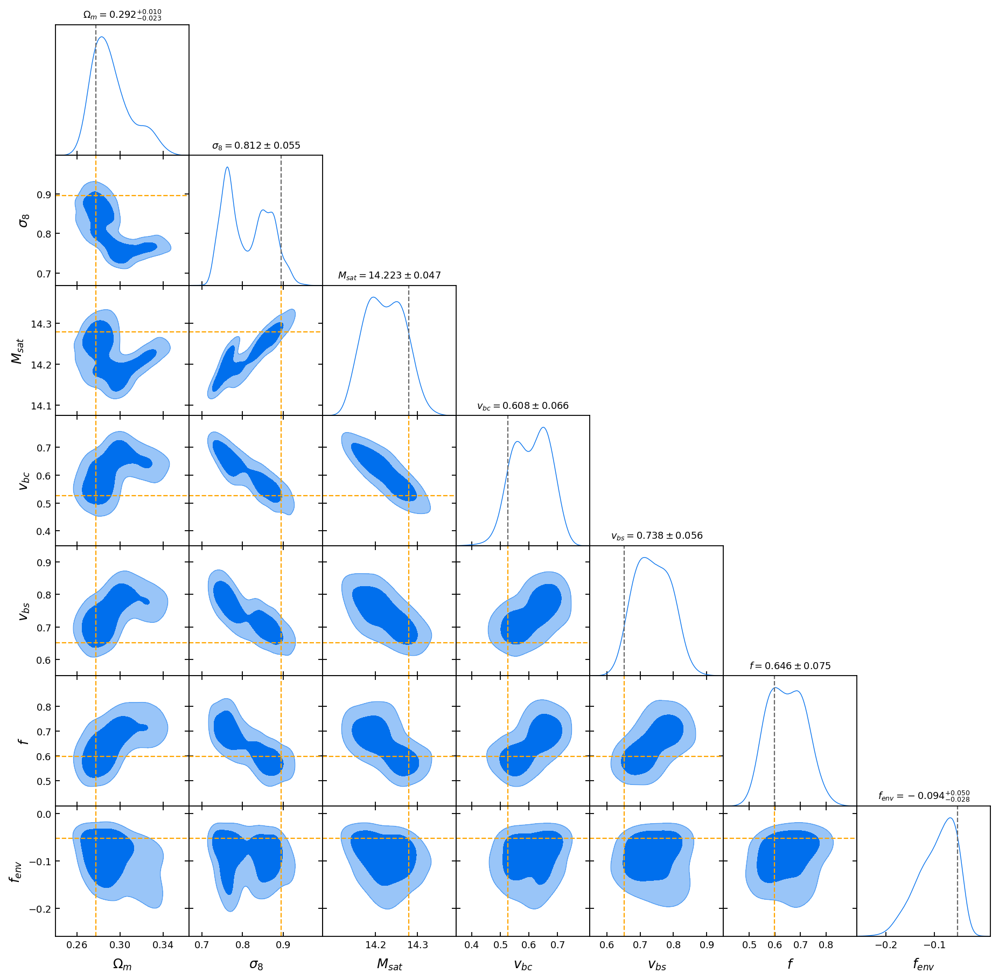

In [146]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params = get_minlogl_params(res, index=-1)
#mean_params = get_mean_posterior(res)
plot_contours_dynesty([chaintag], params_toplot=key_params, 
                      vertical_markers=minlogl_params, vertical_marker_color='orange')

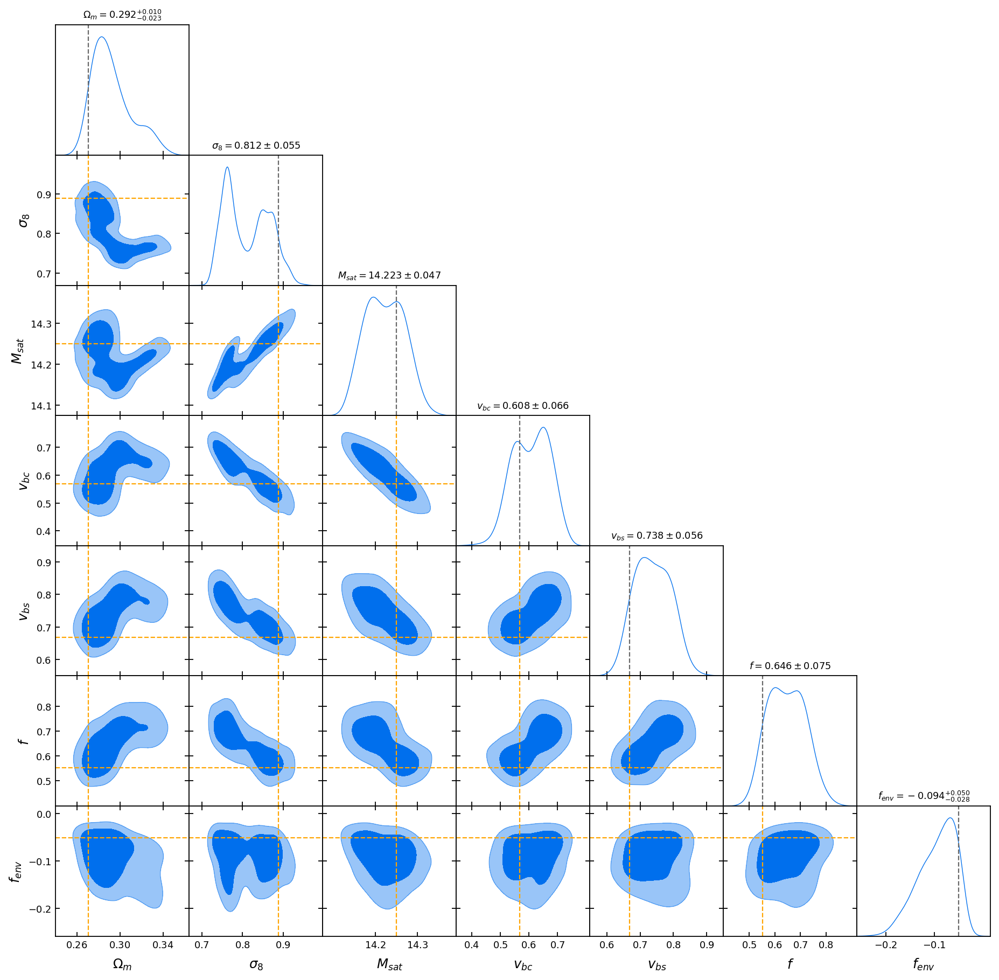

In [155]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params = get_minlogl_params(res, index=-2)
#mean_params = get_mean_posterior(res)
plot_contours_dynesty([chaintag], params_toplot=key_params, 
                      vertical_markers=minlogl_params, vertical_marker_color='orange')

Building emulators
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for wp built
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for xi built
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for upf built
george version: 0.3.1
Loading training data
Nparams: 18
Loading testing data
Nparams: 18
Rebuilding emulators
Emulator for mcf built


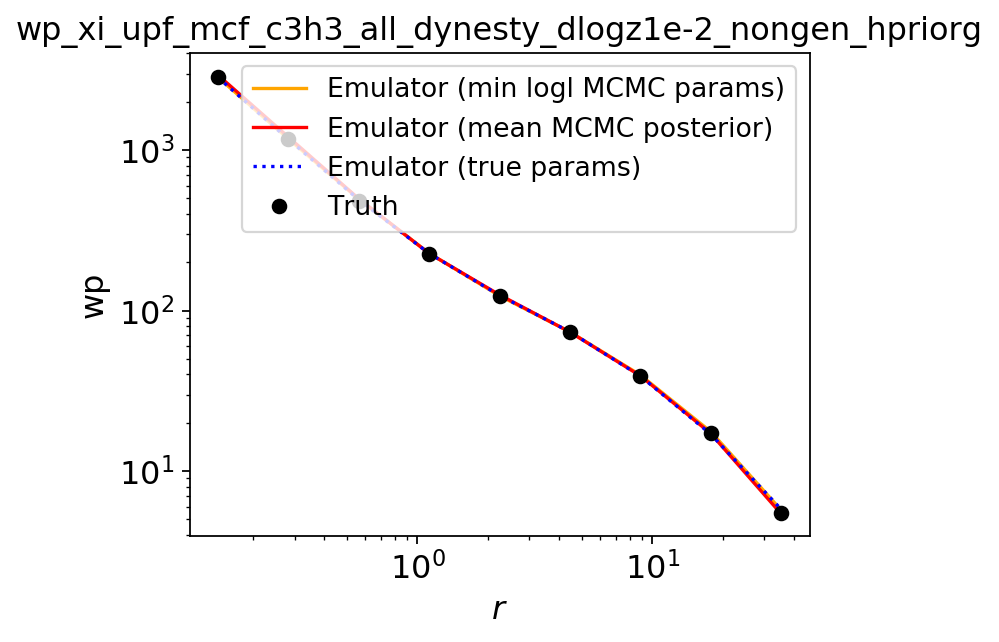

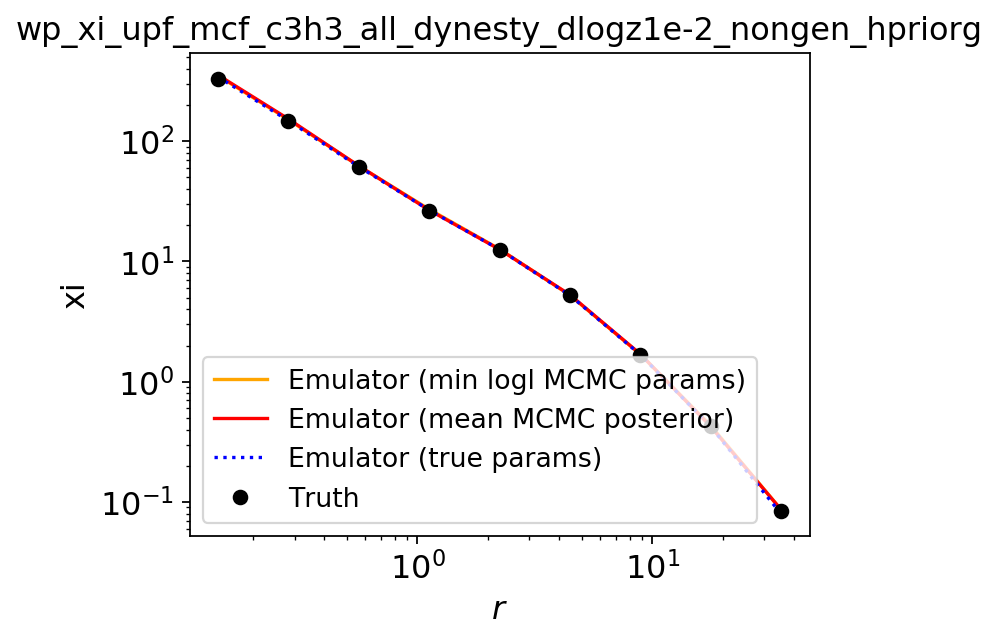

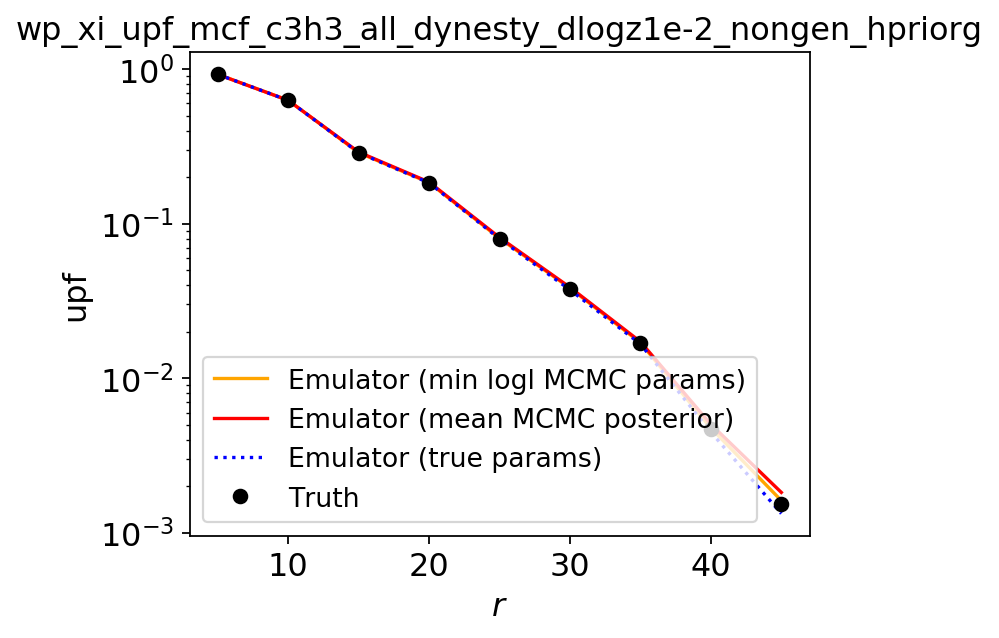

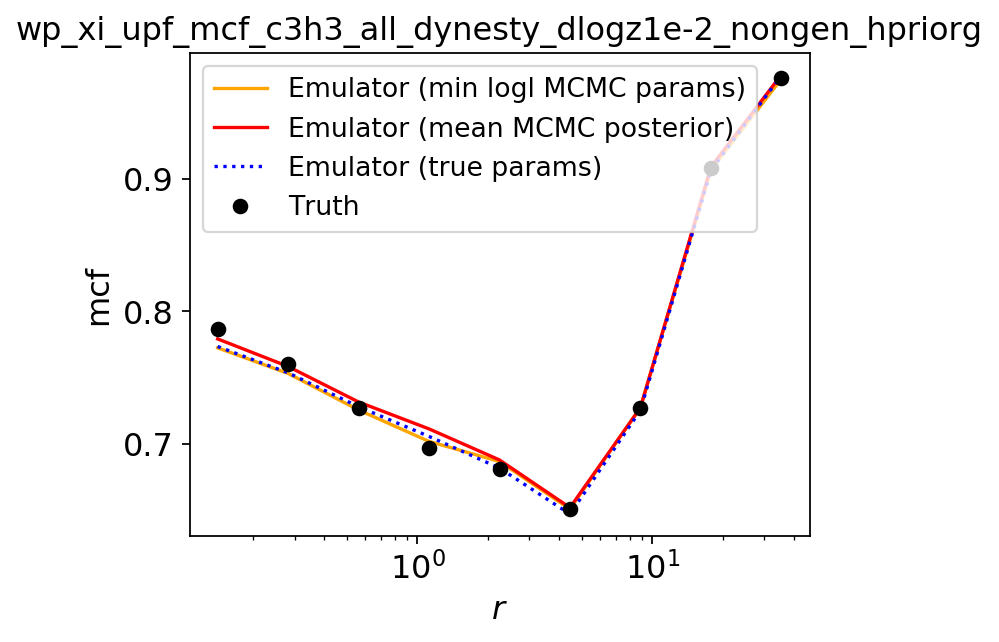

In [153]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
fits = get_fits(chaintag)
plot_fits(*fits, title=chaintag)

In [ ]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params = get_minlogl_params(res, index=-2)
#mean_params = get_mean_posterior(res)
plot_contours_dynesty([chaintag], params_toplot=key_params, 
                      vertical_markers=minlogl_params, vertical_marker_color='limegreen')

-8959818.87929685 -8.898950471368908
(49532, 18)


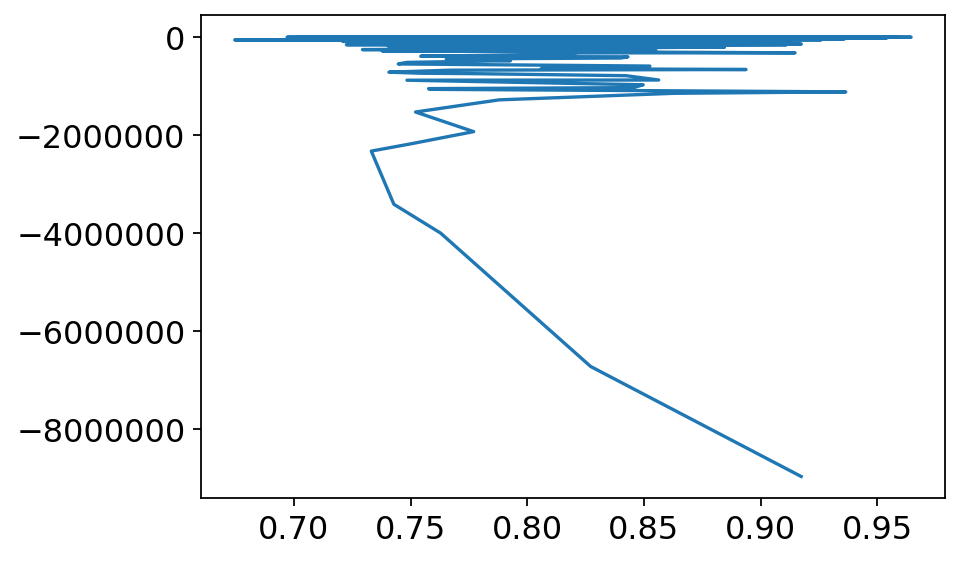

In [124]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
samples = res['samples']
logl = res['logl']
print(min(res['logl']), max(res['logl']))

lnweight = np.array(res['logwt'])
lnevidence = np.array(res['logz'])
#[-1] bc just care about final evidence value
weights = np.exp(lnweight - lnevidence[-1]) 
#weights = weights.flatten()
samples_equal = dynesty.utils.resample_equal(samples, weights)
print(samples_equal.shape)
sigma8 = samples_equal[:,2]

plt.plot(sigma8, logl)

-5714934.842925123 -0.15971823985930028


Text(0, 0.5, '\\sigma_8')

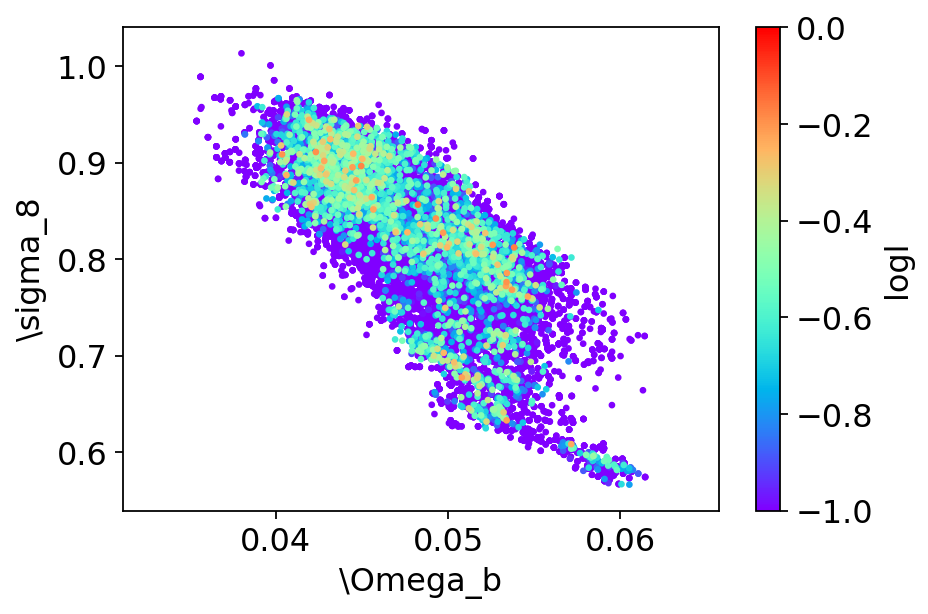

In [230]:
#chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
chaintag = 'wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'


res = load_res(chaintag)
samples = res['samples']
logl = res['logl']
print(min(res['logl']), max(res['logl']))

lnweight = np.array(res['logwt'])
lnevidence = np.array(res['logz'])
#[-1] bc just care about final evidence value
weights = np.exp(lnweight - lnevidence[-1]) 
samples_equal = dynesty.utils.resample_equal(samples, weights)
omegam = samples_equal[:,1]
sigma8 = samples_equal[:,2]


colormap = plt.cm.rainbow #or any other colormap
normalize = matplotlib.colors.Normalize(vmin=-1, vmax=0)
#normalize = matplotlib.colors.Normalize(vmin=min(res['logl']), vmax=max(res['logl']))
sm = plt.cm.ScalarMappable(cmap=colormap, norm=normalize)
plt.scatter(omegam, sigma8, c=logl, s=4, cmap=colormap, norm=normalize)
plt.colorbar(sm, label='logl')
#plt.scatter(x, y, c=z, s=5, cmap=colormap, norm=normalize, marker='*')
plt.xlabel(param_labels['Omega_b'])
plt.ylabel(param_labels['sigma_8'])

In [142]:
print(logl[-1])
print(logl[-10:])

-0.15971823985930028
[-0.20847022 -0.20599108 -0.20514887 -0.19885693 -0.19368909 -0.19275629
 -0.19219784 -0.17533104 -0.1644477  -0.15971824]


In [140]:
samples[-8:,2]

array([0.78068935, 0.77896679, 0.81229166, 0.77838933, 0.91760676,
       0.81247715, 0.88951465, 0.85660816])

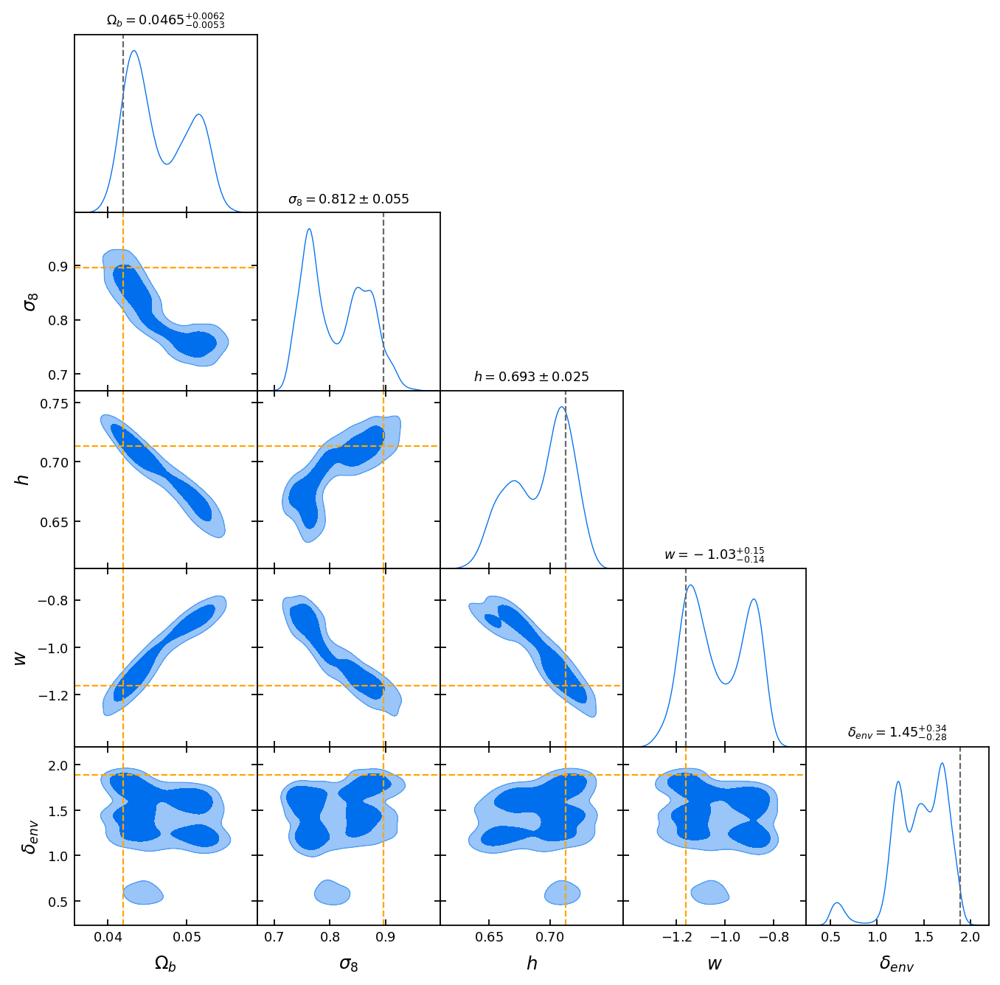

In [168]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params = get_minlogl_params(res, index=-1)
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=minlogl_params, vertical_marker_color='orange')

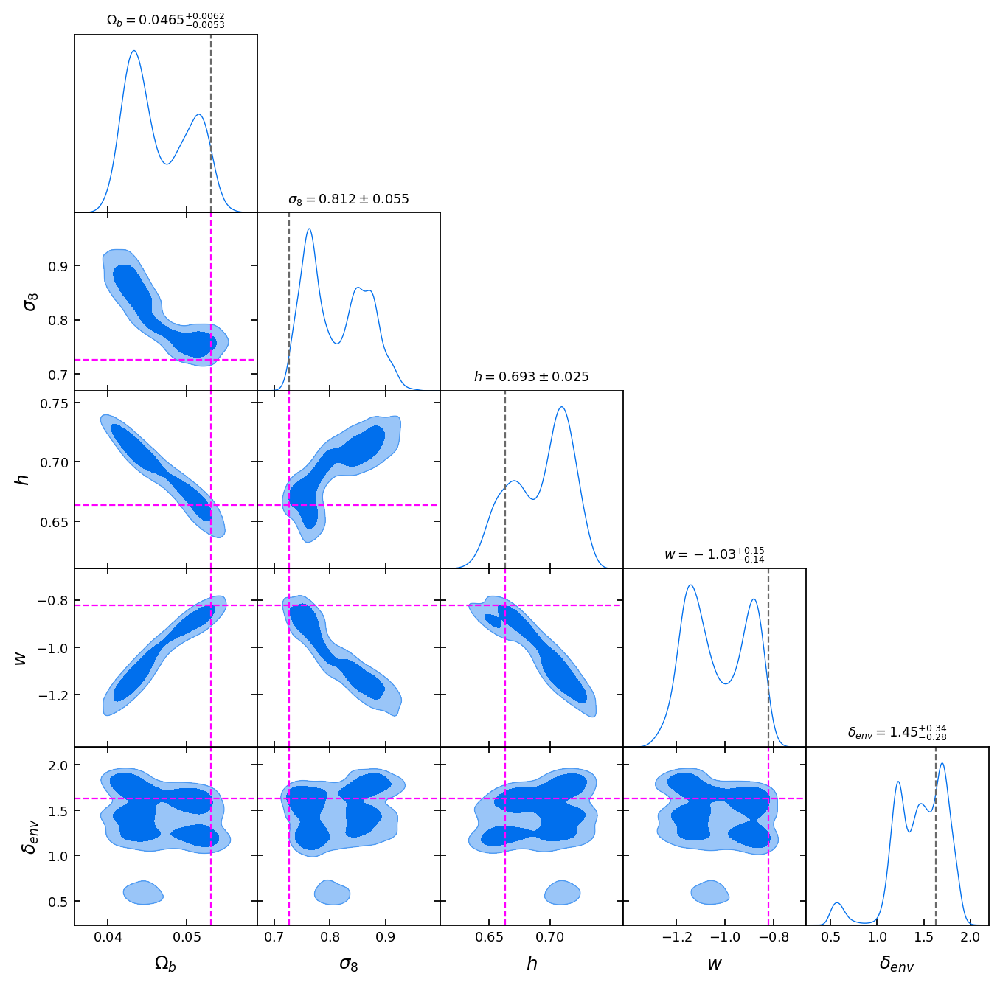

In [178]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params = get_minlogl_params(res, index=-19)
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=minlogl_params, vertical_marker_color='magenta')

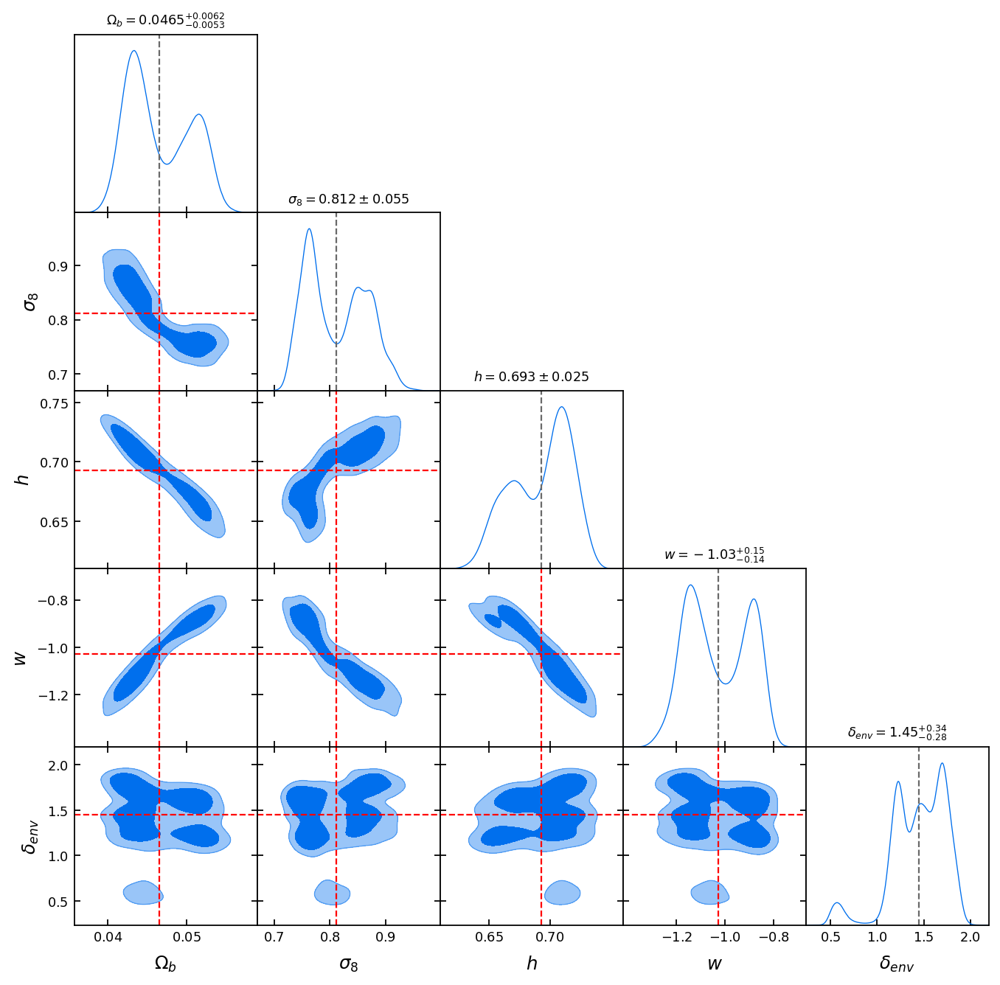

In [208]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
mean_params = get_mean_params(res)
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=mean_params, vertical_marker_color='red')

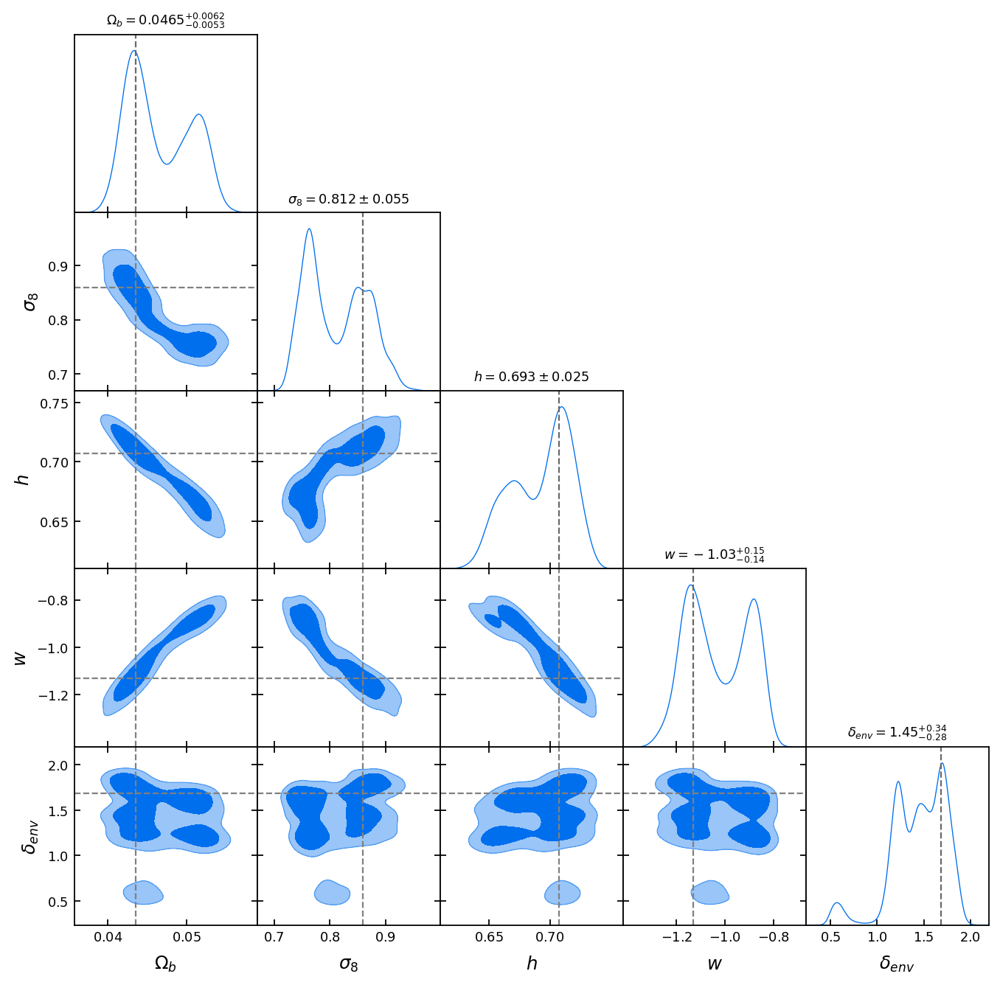

In [216]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
true_params = get_true_params(chaintag)
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=true_params, vertical_marker_color='grey')

In [209]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
minlogl_params1 = get_minlogl_params(res, index=-1)
minlogl_params19 = get_minlogl_params(res, index=-19)
mean_params = get_mean_params(res)
true_params = get_true_params(chaintag)
param_arr = [true_params, mean_params, minlogl_params1, minlogl_params19]
fit_labels = ['Emulator (true params)', 'Emulator (mean params)', 'Emulator (params from mode 1)', 'Emulator (params from mode 2)']
statistics, vals_arr_all, fit_labels = get_fits(chaintag, param_arr, fit_labels)

Building emulators
Rebuilding emulator for wp
Rebuilding emulator for xi
Rebuilding emulator for upf
Rebuilding emulator for mcf


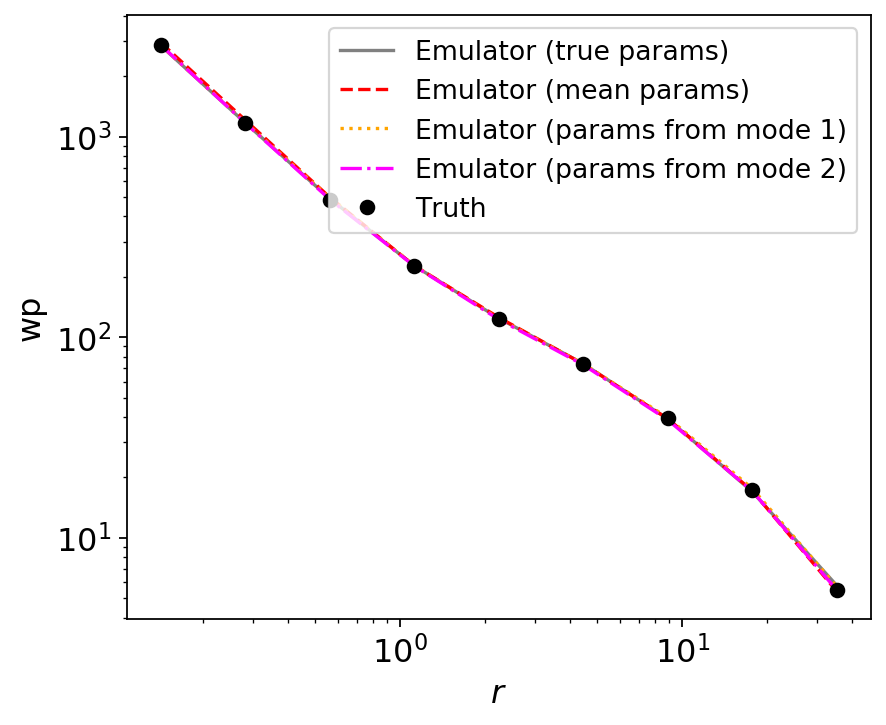

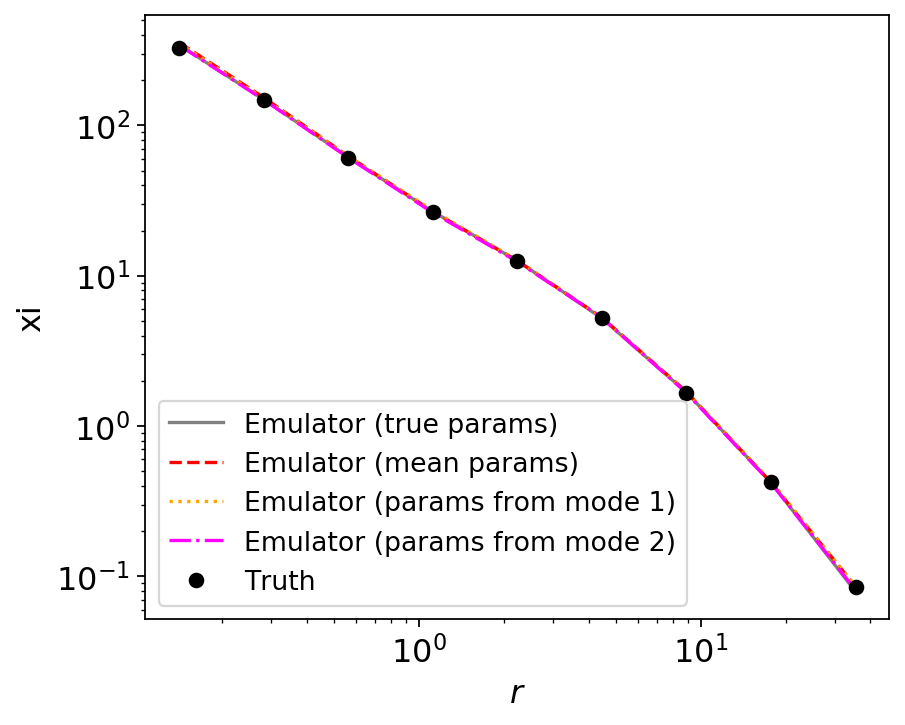

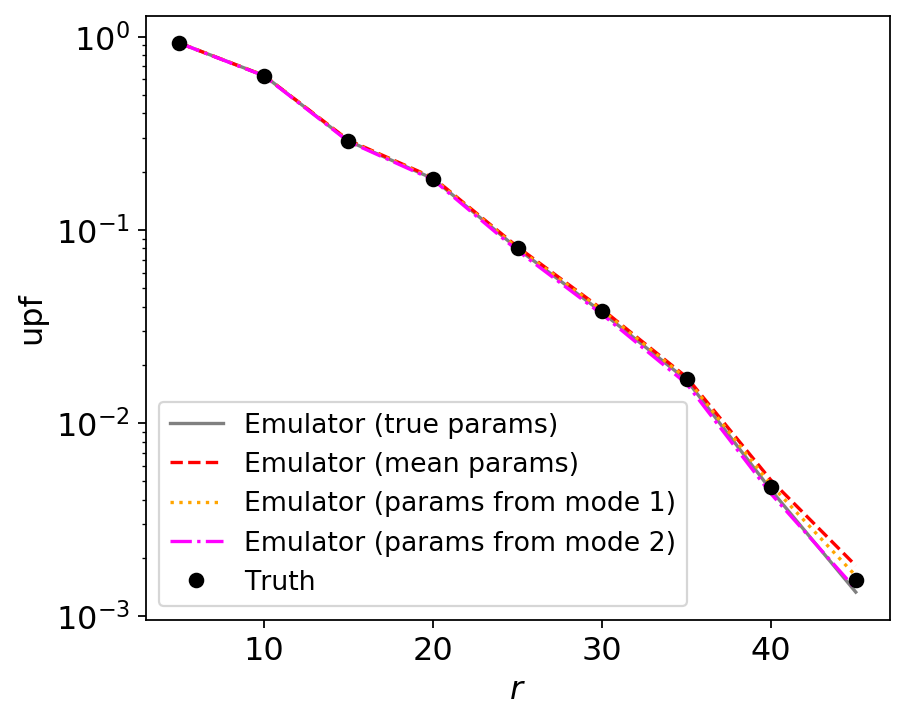

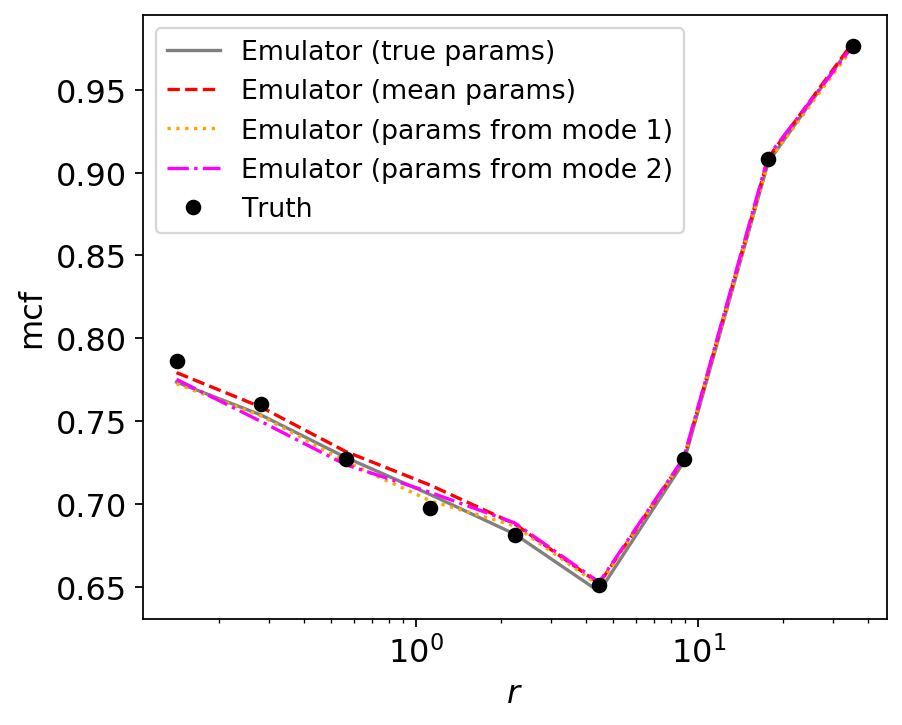

In [221]:
fit_colors = ['grey', 'red', 'orange', 'magenta']
plot_fits(statistics, vals_arr_all, fit_labels, fit_colors, title='')

In [177]:
for i in range(1,20):
    p = get_minlogl_params(res, index=-i)
    
    print(i, p[2], res['logl'][-i])

1 0.8955303938221709 -8.898950471368908
2 0.8889520702594025 -8.954122672103837
3 0.9009673322745485 -9.01115236667269
4 0.9023399772910511 -9.05609996333407
5 0.8988060280466024 -9.115221810777646
6 0.8869916818851915 -9.206786962312798
7 0.8806300889102201 -9.264919839049005
8 0.887003972139393 -9.271797163961146
9 0.8844443876306346 -9.277136088692409
10 0.8726036132801306 -9.293768196038911
11 0.8766669060475358 -9.299323674140767
12 0.880314712360948 -9.304118394372535
13 0.8720524113608055 -9.311917053283343
14 0.8905110222269652 -9.354588620091171
15 0.8866971631796848 -9.400482260563226
16 0.8845532651146599 -9.418344583104904
17 0.8816345462078992 -9.4238151455021
18 0.8985122842833343 -9.427777173398688
19 0.7265169664124574 -9.461108731065657


In [175]:
get_minlogl_params(res, index=-19)

array([ 0.3054571 ,  0.05310405,  0.72651697,  0.66348787,  0.9925833 ,
        3.96408867, -0.82200038, 14.15297107,  1.58551505, 12.36517746,
        0.17499496,  0.71488363,  0.82582151,  1.65323078,  0.70761242,
       -0.06023697,  1.63014088,  0.42973977])

# with fractional errors

In [67]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
minlogl_params1 = get_minlogl_params(res, index=-1)
minlogl_params19 = get_minlogl_params(res, index=-19)
mean_params = get_mean_params(res)
true_params = get_true_params(chaintag)
param_arr = [true_params, mean_params, minlogl_params1, minlogl_params19]
statistics, vals_arr_all, vals_true_all = get_fits(chaintag, param_arr)

Building emulators
Rebuilding emulator for wp
Rebuilding emulator for xi
Rebuilding emulator for upf
Rebuilding emulator for mcf


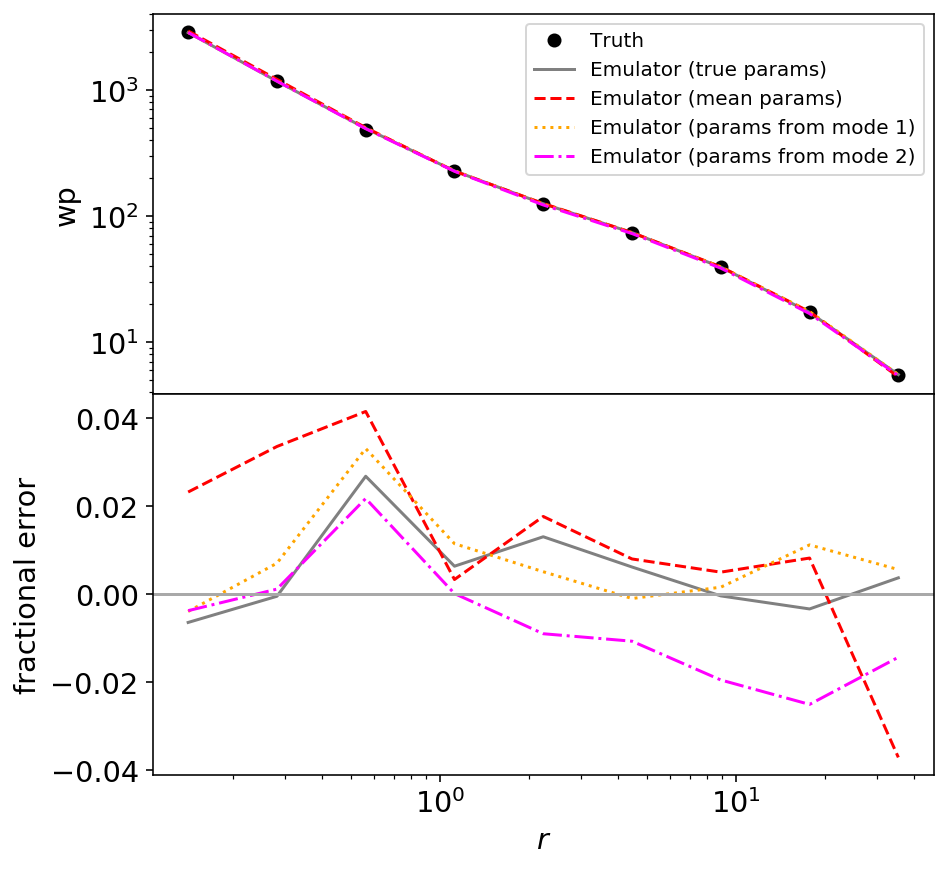

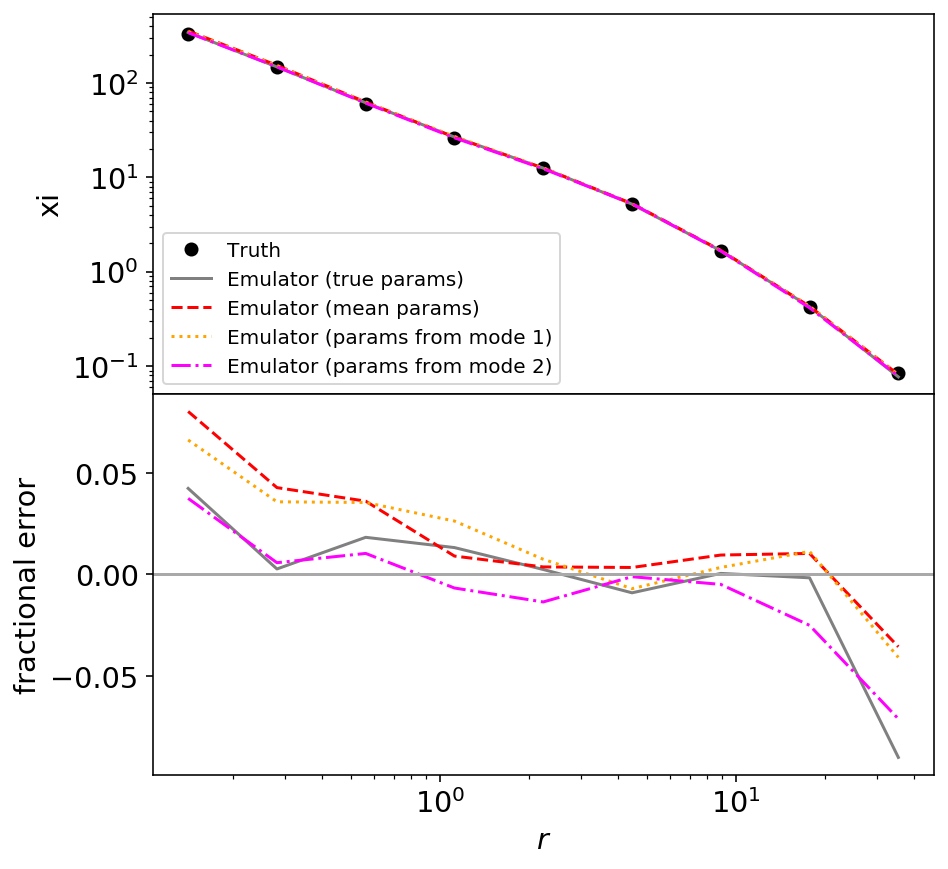

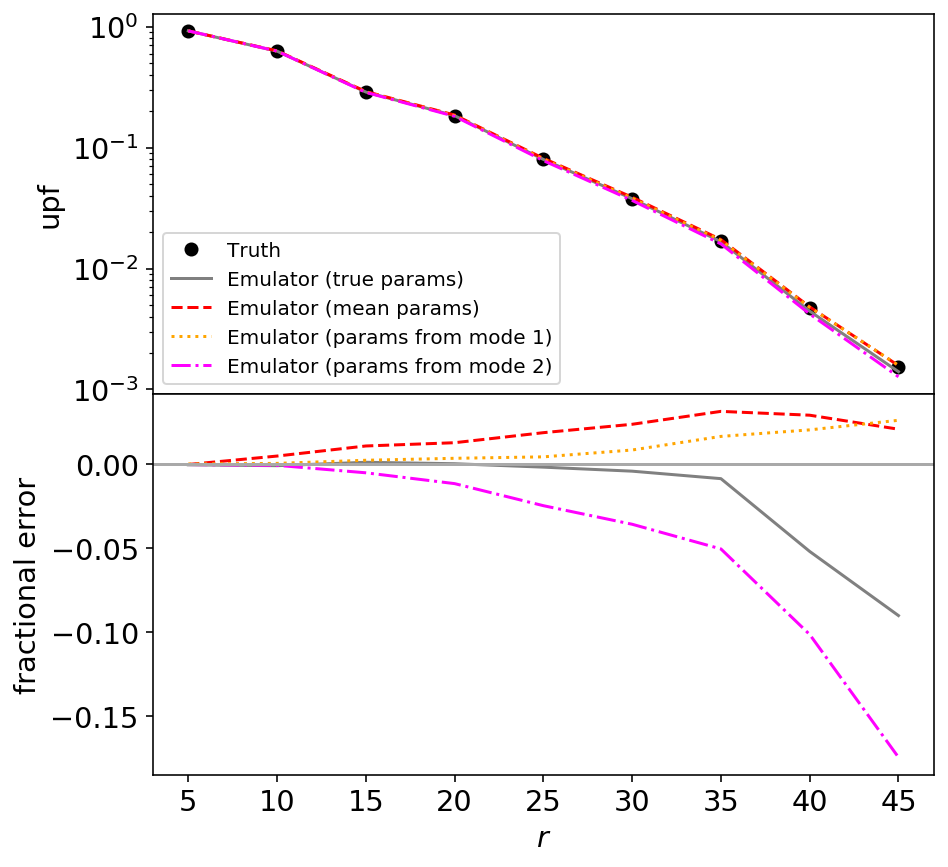

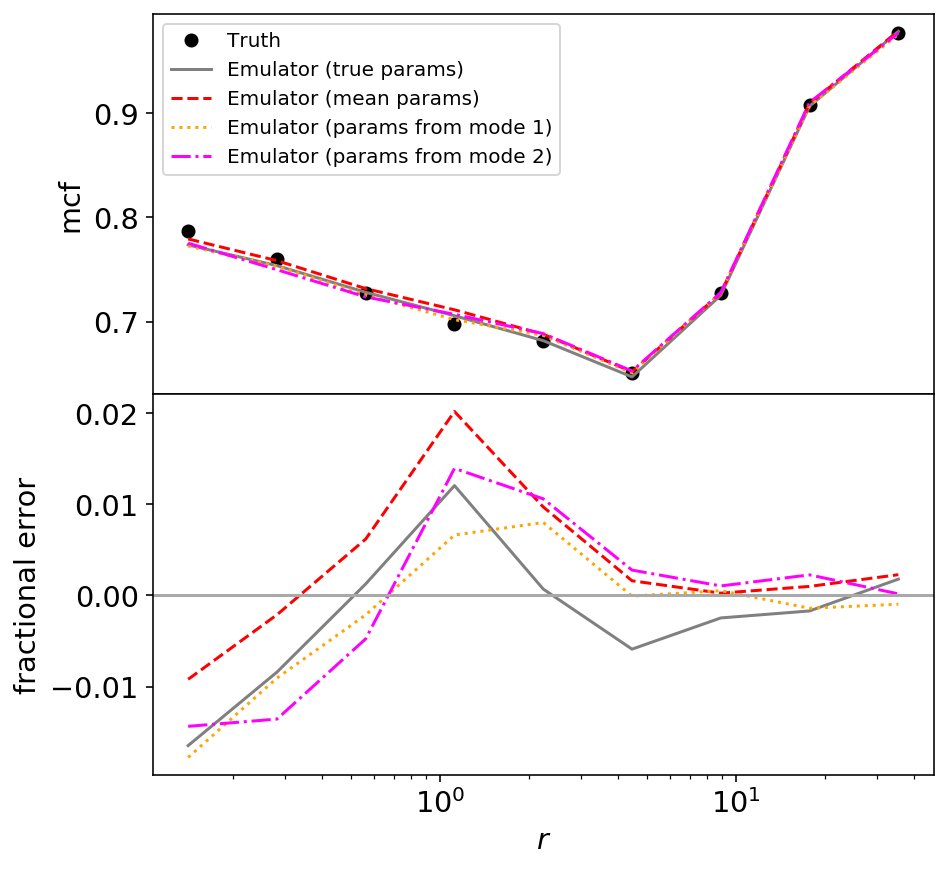

In [68]:
fit_labels = ['Emulator (true params)', 'Emulator (mean params)', 
              'Emulator (params from mode 1)', 'Emulator (params from mode 2)']
fit_colors = ['grey', 'red', 'orange', 'magenta']
plot_fits(statistics, vals_arr_all, vals_true_all, fit_labels, fit_colors, title=chaintag)

# fixgperr

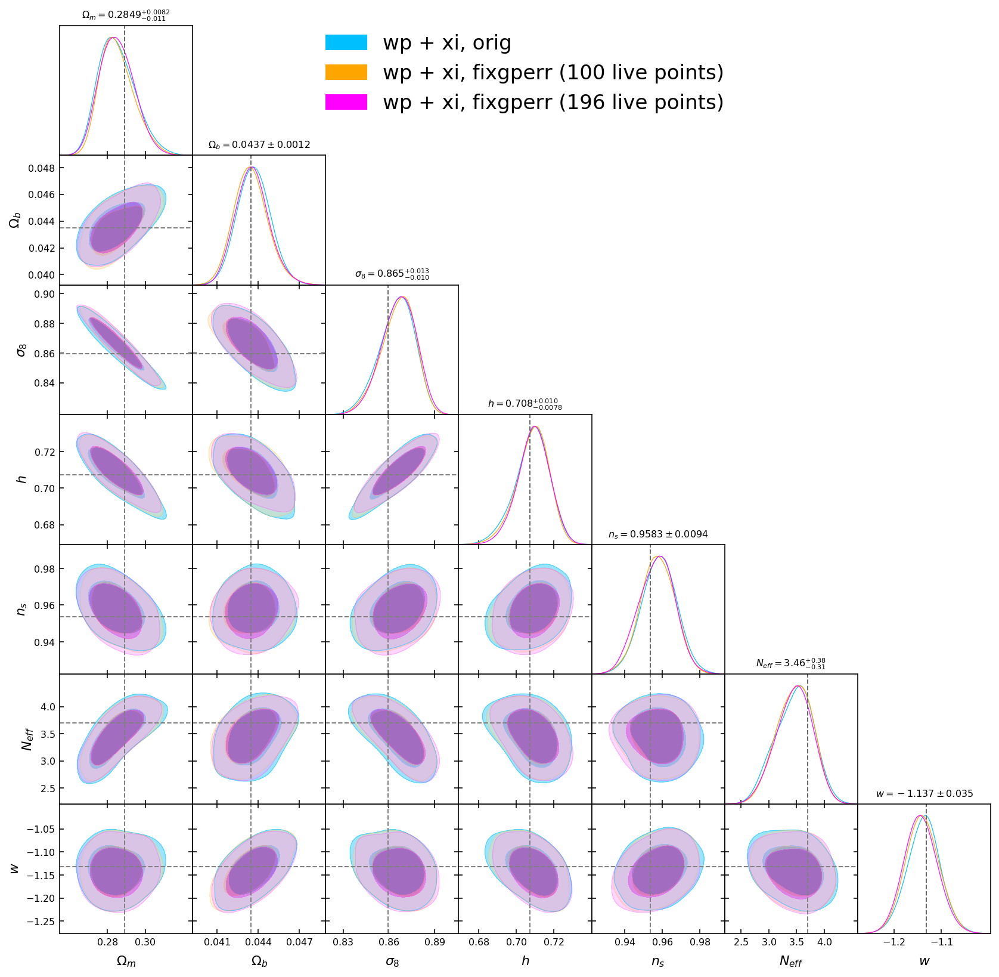

In [10]:
chaintags = ['wp_xi_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr',
             'wp_xi_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex2'
            ]
legend_labels = ['wp + xi, orig',
                 'wp + xi, fixgperr (100 live points)',
                 'wp + xi, fixgperr (196 live points)'
                ]
colors = [cwp,
          'orange',
          'magenta'
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=cosmo_params)

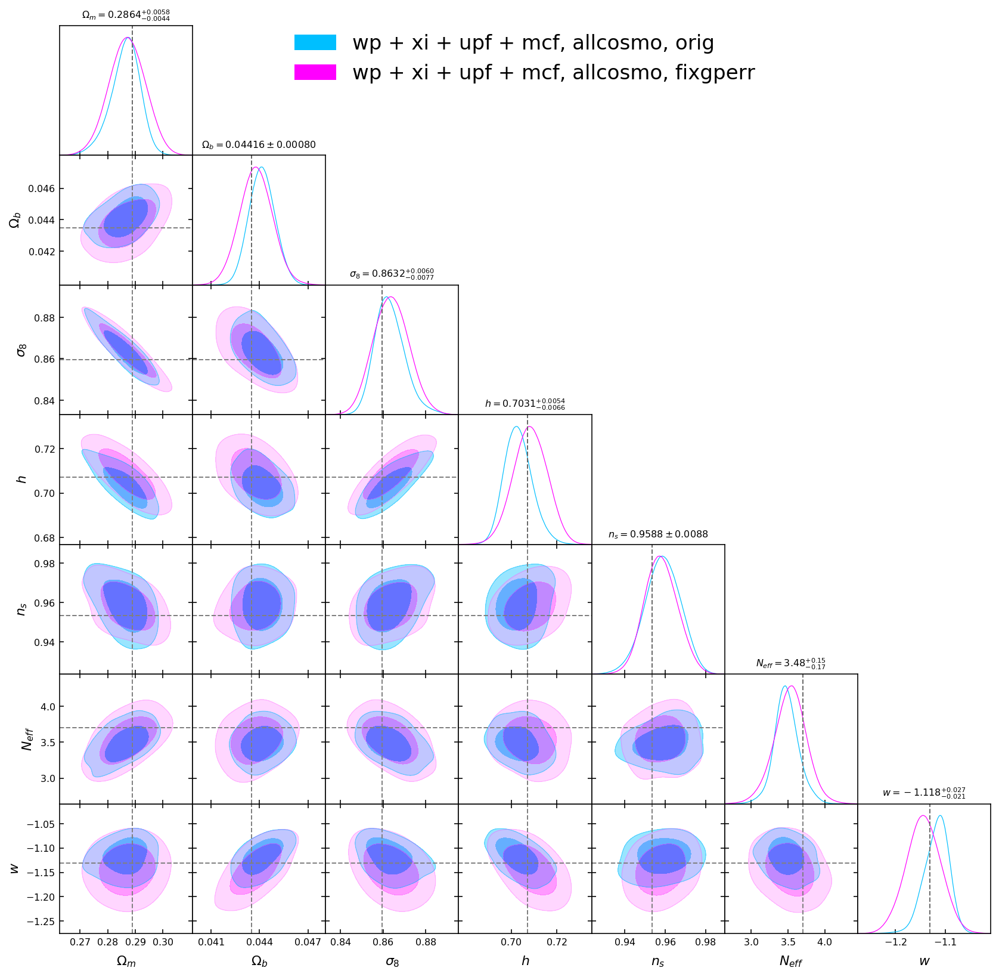

In [9]:
chaintags = ['wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_allcosmo_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr'
            ]
legend_labels = ['wp + xi + upf + mcf, allcosmo, orig',
                 'wp + xi + upf + mcf, allcosmo, fixgperr'
                ]
colors = [cwp, 
          'magenta'
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=cosmo_params)

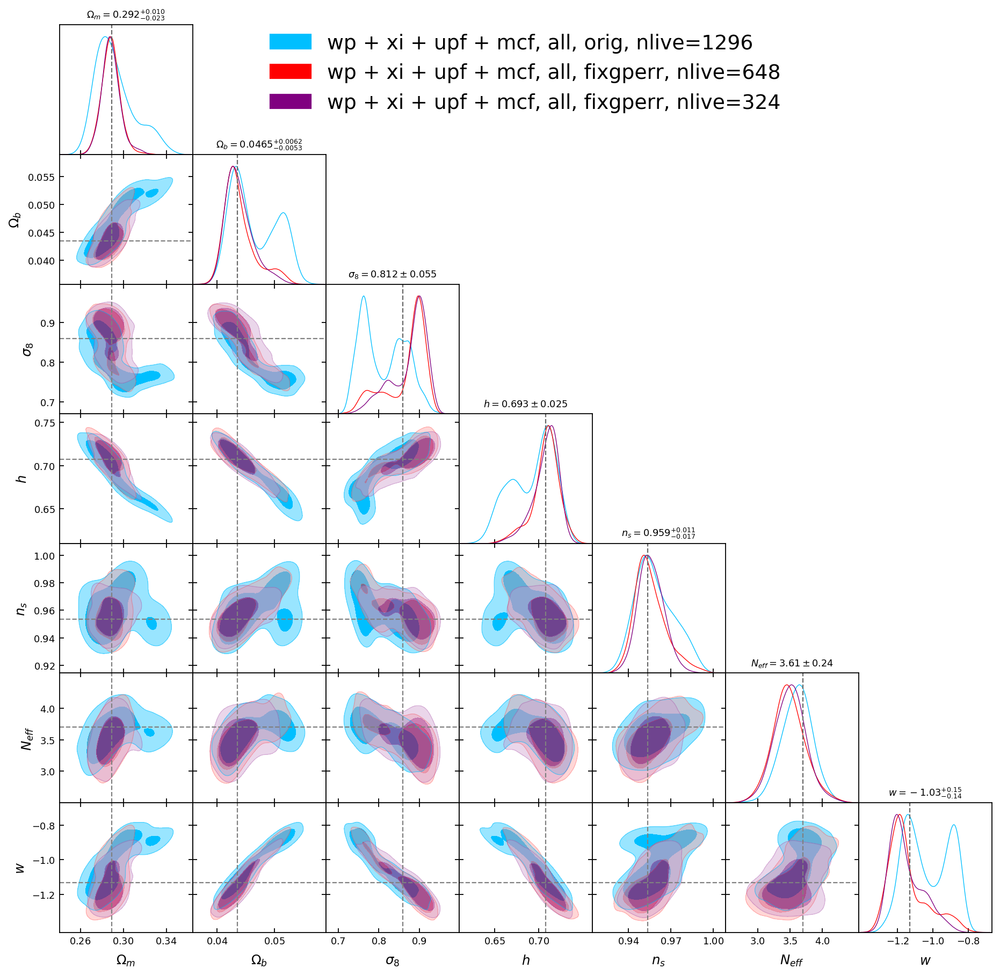

In [56]:
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex1',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex2',
            ]
legend_labels = ['wp + xi + upf + mcf, all, orig, nlive=1296',
                 'wp + xi + upf + mcf, all, fixgperr, nlive=648',
                 'wp + xi + upf + mcf, all, fixgperr, nlive=324',
                ]
colors = [cwp, 
          'red',
          'purple',
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=cosmo_params)

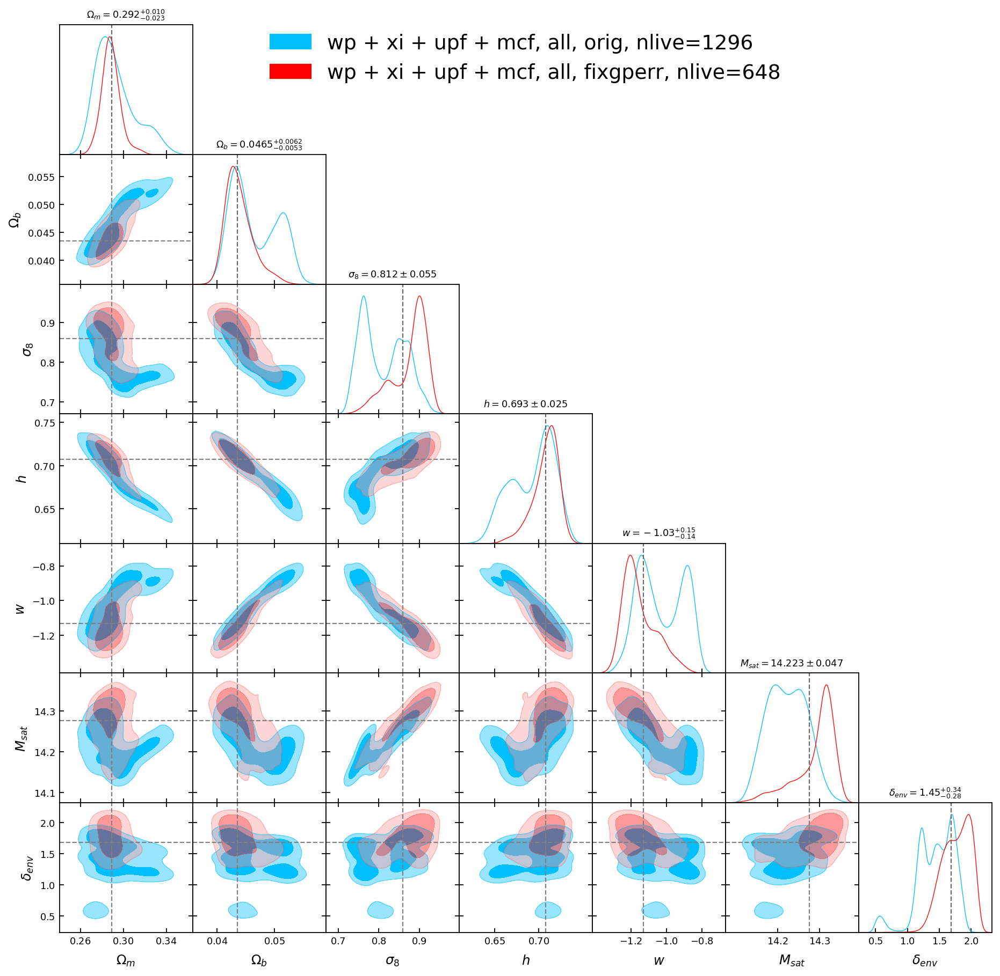

In [109]:
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex2',
            ]
legend_labels = ['wp + xi + upf + mcf, all, orig, nlive=1296',
                 'wp + xi + upf + mcf, all, fixgperr, nlive=648',
                ]
colors = [cwp, 
          'red',
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=biplus_params)

In [16]:
# TODO: plot fits from low sig8, high peak, and truth

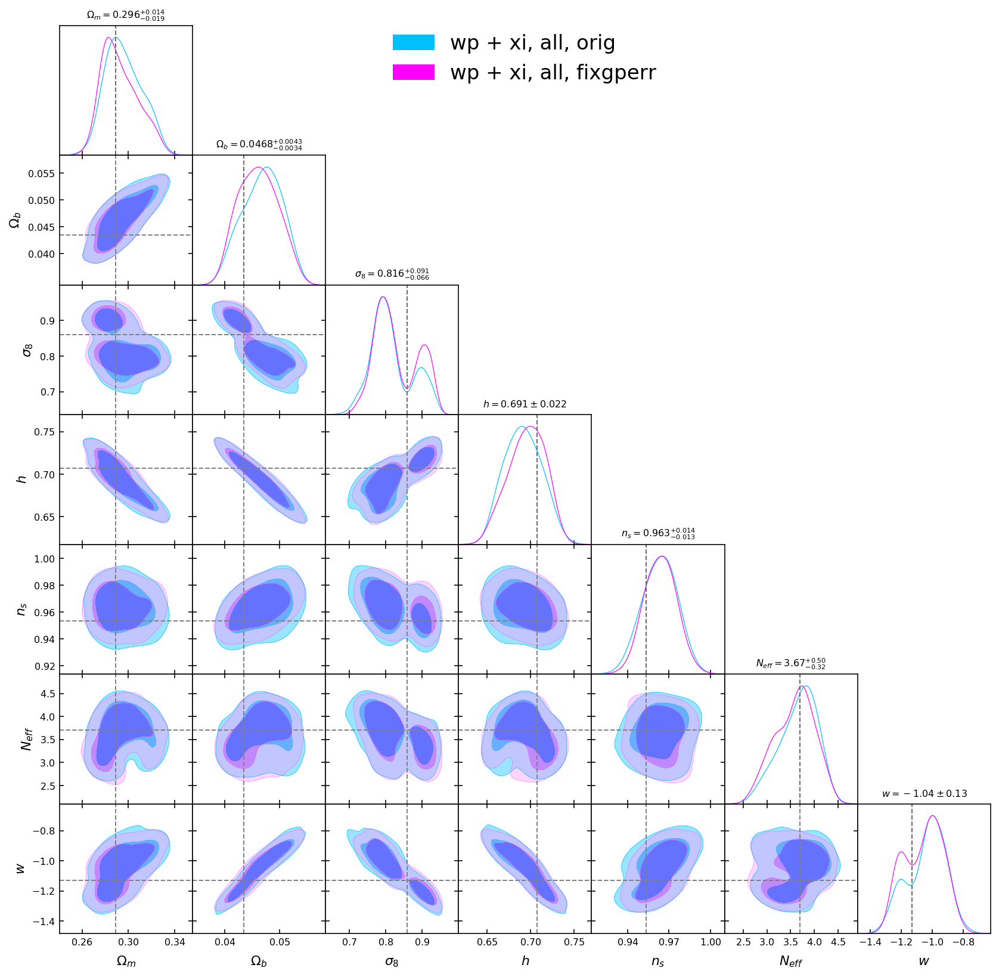

In [13]:
chaintags = ['wp_xi_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr',
            ]
legend_labels = ['wp + xi, all, orig',
                 'wp + xi, all, fixgperr',
                ]
colors = [cwp,
          'magenta'
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=cosmo_params)

# fits for fixgperr

In [49]:
# find mode of interest!
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex2'
res = load_res(chaintag)
# loop in low->high logl order
for i in range(1,10000):
    #p[2]: sigma_8
    p = get_minlogl_params(res, index=-i)
    if p[2]<0.85:
        print(i, p[2], res['logl'][-i])

3504 0.8237266357422256 -8.51656298718505
3541 0.8360111512018771 -8.539189950985257
3589 0.8287534971430981 -8.584725181406629
3591 0.8447512409789969 -8.587127591345169
3723 0.8447576638211507 -8.69929382623169
3802 0.8451836002367327 -8.764932492650576
3828 0.8474915830266763 -8.792471928503982
3839 0.8181237565019104 -8.802912468351456
3986 0.8337892752993439 -8.919159890972377
4190 0.8379051090967631 -9.112013983024402
4218 0.8097996814372083 -9.133201566869442
4300 0.8305649135744901 -9.217930378521686
4344 0.8350813450443458 -9.25613014781592
4359 0.827680602085295 -9.271378739629249
4380 0.8424387795925172 -9.294962171471903
4403 0.8238318445955358 -9.31533228011554
4432 0.8402761492356253 -9.340087686168356
4437 0.7938809191869473 -9.343141492414588
4488 0.8291338955262504 -9.39018121936108
4521 0.844788792943683 -9.420307505464113
4522 0.8229054972587734 -9.423444027980098
4575 0.8098037209241845 -9.466389153524897
4607 0.8156322054378466 -9.50797483392679
4634 0.819296044750

7957 0.7515819730623583 -14.120195457941037
7958 0.8375911573973149 -14.120250906903223
7959 0.7613645504116585 -14.120514991069992
7961 0.8318201152836017 -14.122826979875526
7962 0.8033950394978756 -14.123952820632582
7964 0.8406119249324063 -14.129606508214856
7965 0.8203812045508234 -14.131764097134639
7966 0.7579847195112668 -14.132620798205334
7975 0.7989678626516338 -14.145923748481993
7976 0.8440416436056434 -14.146968798498108
7984 0.8105869877618442 -14.156597658689336
7985 0.829348828801429 -14.157741283817586
7986 0.8256541294754319 -14.15864937253047
7989 0.7832394483208659 -14.1598526485105
7990 0.7888160308167657 -14.160189972267696
7992 0.7625250624518477 -14.164414718891486
7993 0.8461375804426894 -14.166319750886805
7996 0.8256809122055699 -14.169178294033804
7997 0.8409488728810344 -14.176740416436672
8002 0.8096097235924659 -14.182287457458163
8003 0.8147626796752233 -14.182324302069018
8005 0.7629181764529227 -14.188645540988405
8007 0.8173185701047011 -14.18941026

9471 0.7627352064972087 -17.814655384267027
9472 0.8310702925167393 -17.81730473846075
9474 0.8484106800190335 -17.822653977985958
9476 0.8203113358403263 -17.826166203221117
9478 0.7354416641219479 -17.829267817841803
9480 0.8027369101600387 -17.830855723372615
9482 0.8351394050062574 -17.842531961730355
9484 0.7824878735298899 -17.85128102511001
9485 0.8357639204526307 -17.851792584228125
9490 0.8456048269345549 -17.860358731392374
9492 0.8032892814008568 -17.863751776149986
9493 0.7891981436312052 -17.869485915292174
9496 0.8253685629273146 -17.87520047813414
9497 0.8036111382949596 -17.882484338991365
9498 0.8014041611562566 -17.883423500115338
9500 0.7961742218115778 -17.883947386957264
9503 0.7978182396144041 -17.8860765517908
9504 0.7515542426809169 -17.88813433126264
9505 0.8107484436857066 -17.89781326305459
9514 0.8002978711220863 -17.925969293490333
9516 0.7526411463272077 -17.928341123587067
9517 0.8014022997942144 -17.92954991832368
9518 0.7754094201425749 -17.930647652850

In [94]:
chaintag = 'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex2'
res = load_res(chaintag)
true_params = get_true_params(chaintag)
mean_params = get_mean_params(res)
mode1_params = get_minlogl_params(res, index=-1)
mode2_params = get_minlogl_params(res, index=-3504)

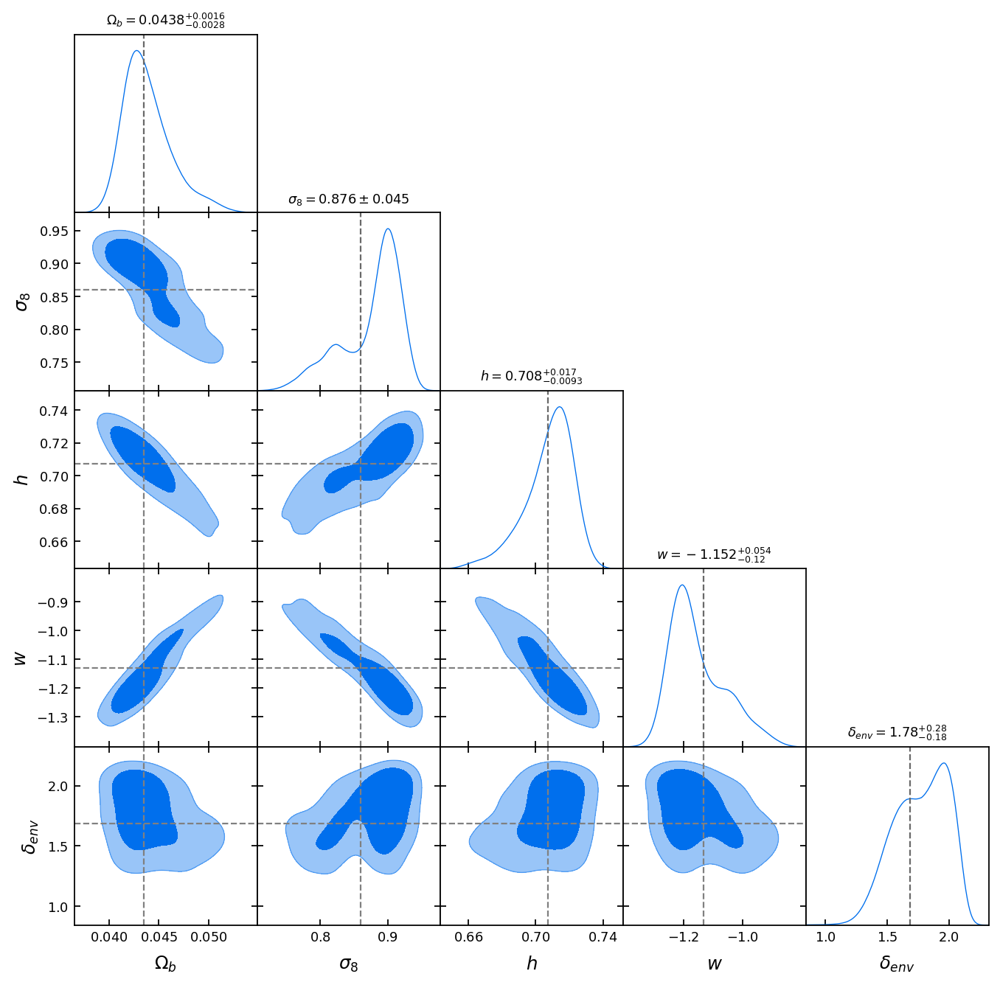

In [39]:
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=true_params, vertical_marker_color='grey')

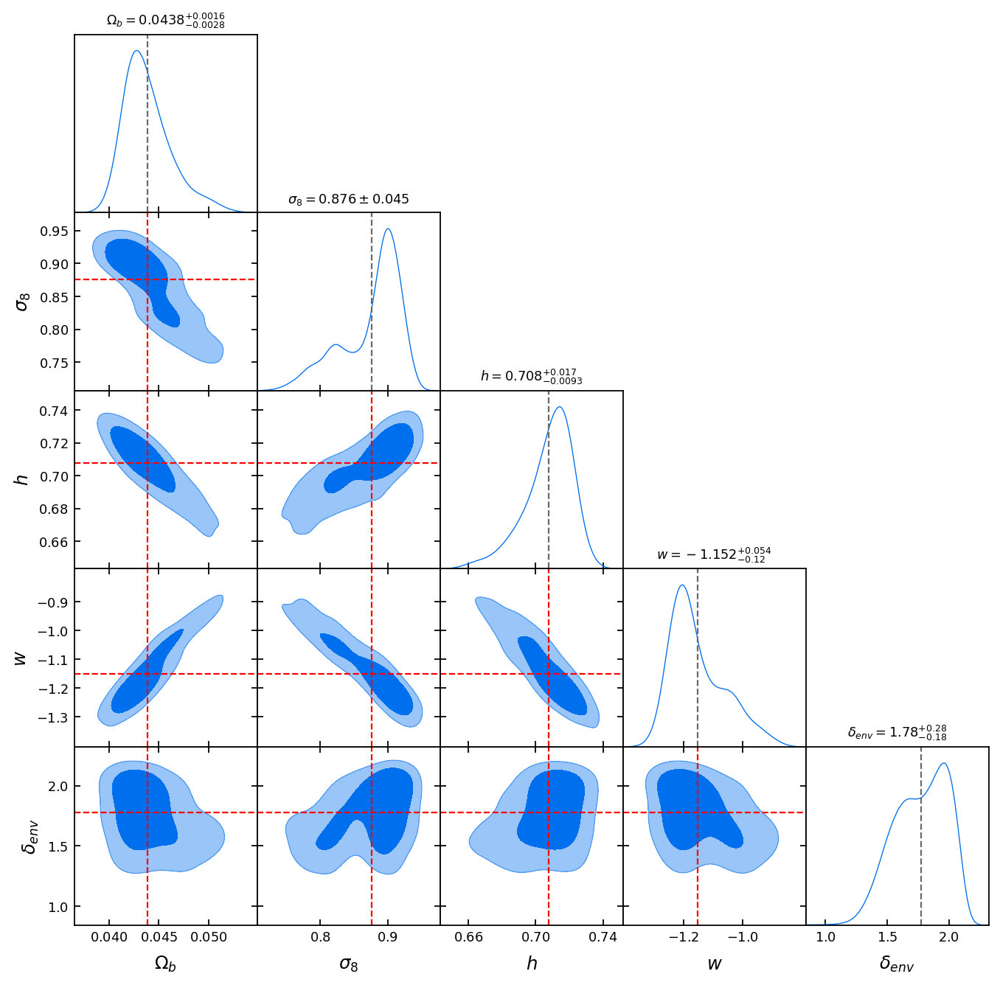

In [40]:
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=mean_params, vertical_marker_color='red')

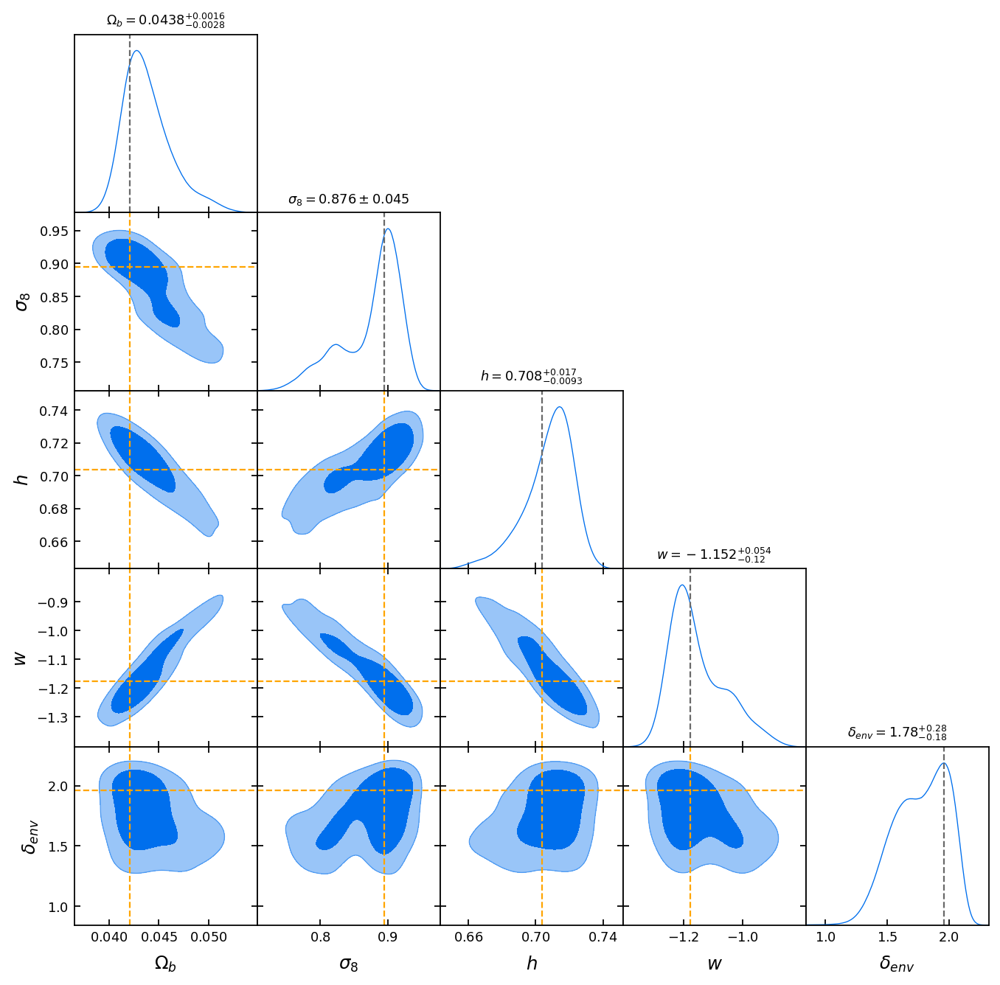

In [41]:
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=mode1_params, vertical_marker_color='orange')

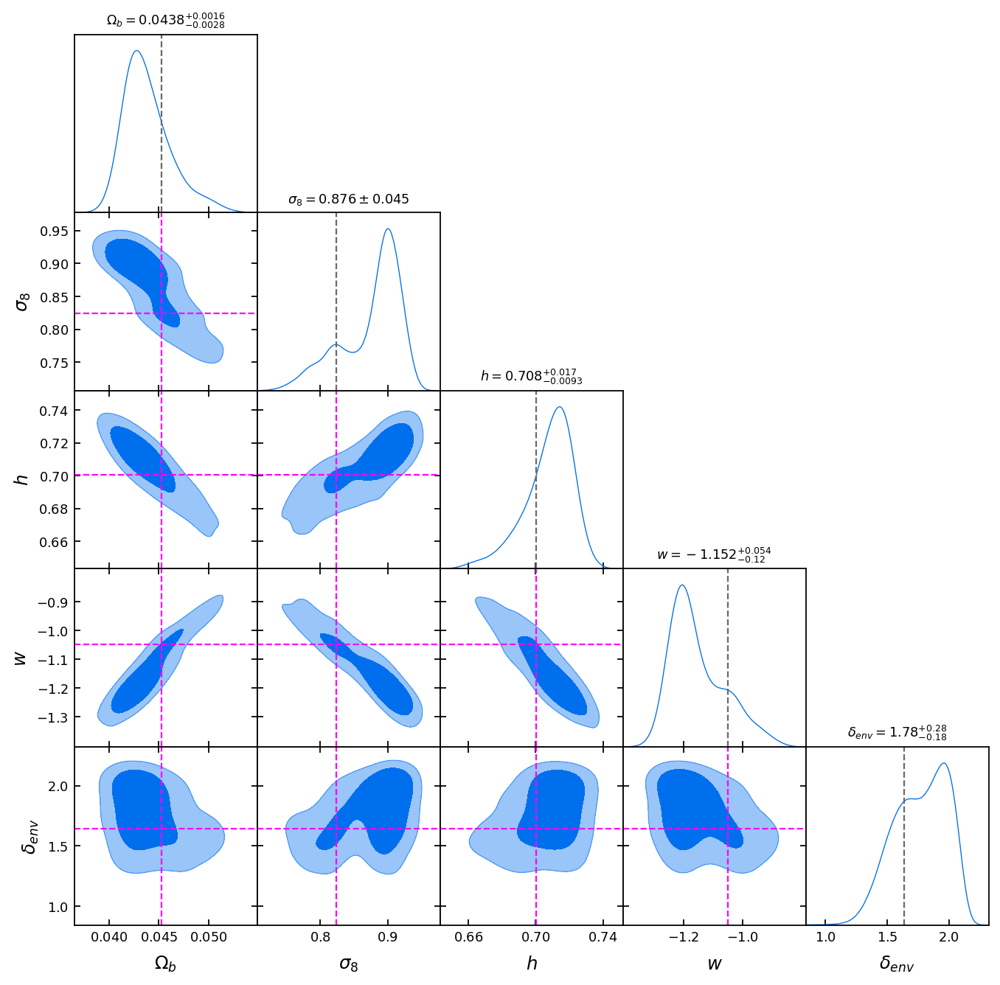

In [53]:
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=mode2_params, vertical_marker_color='magenta')

In [95]:
param_arr = [true_params, mean_params, mode1_params, mode2_params]
statistics, vals_arr_all, vals_true_all, gperrs = get_fits(chaintag, param_arr)

Building emulators
Rebuilding emulator for wp
Rebuilding emulator for xi
Rebuilding emulator for upf
Rebuilding emulator for mcf


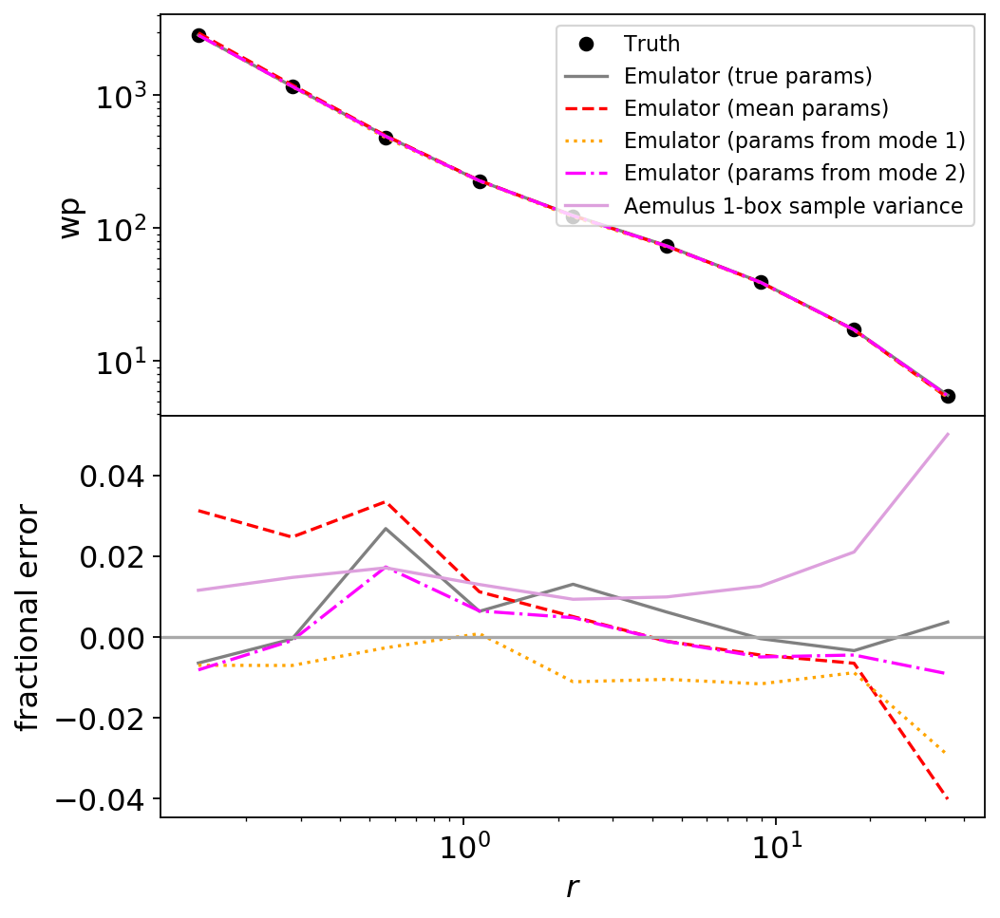

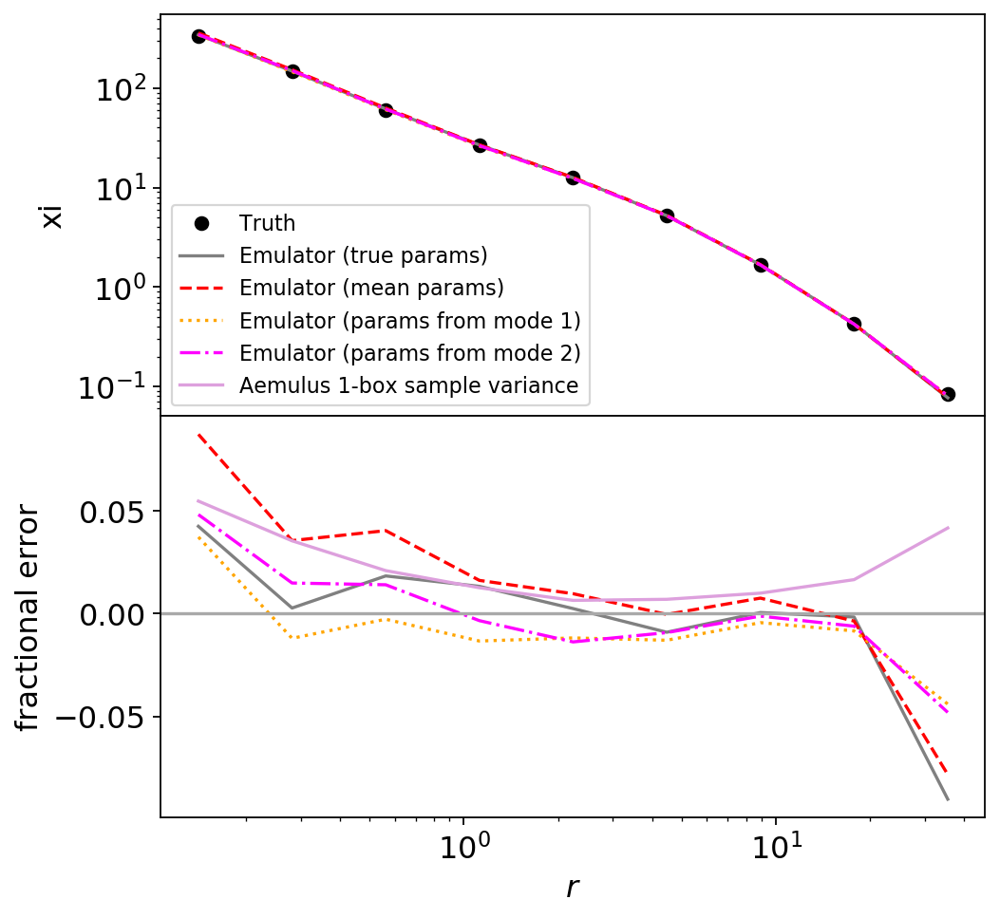

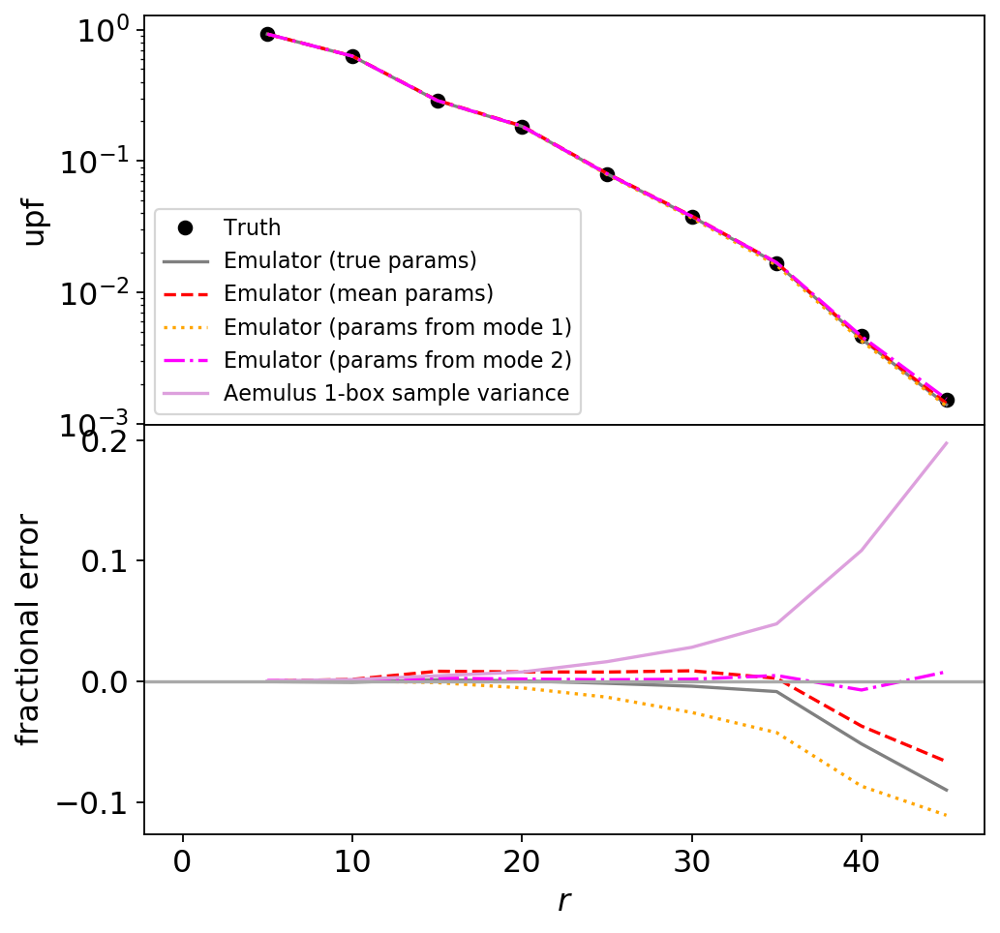

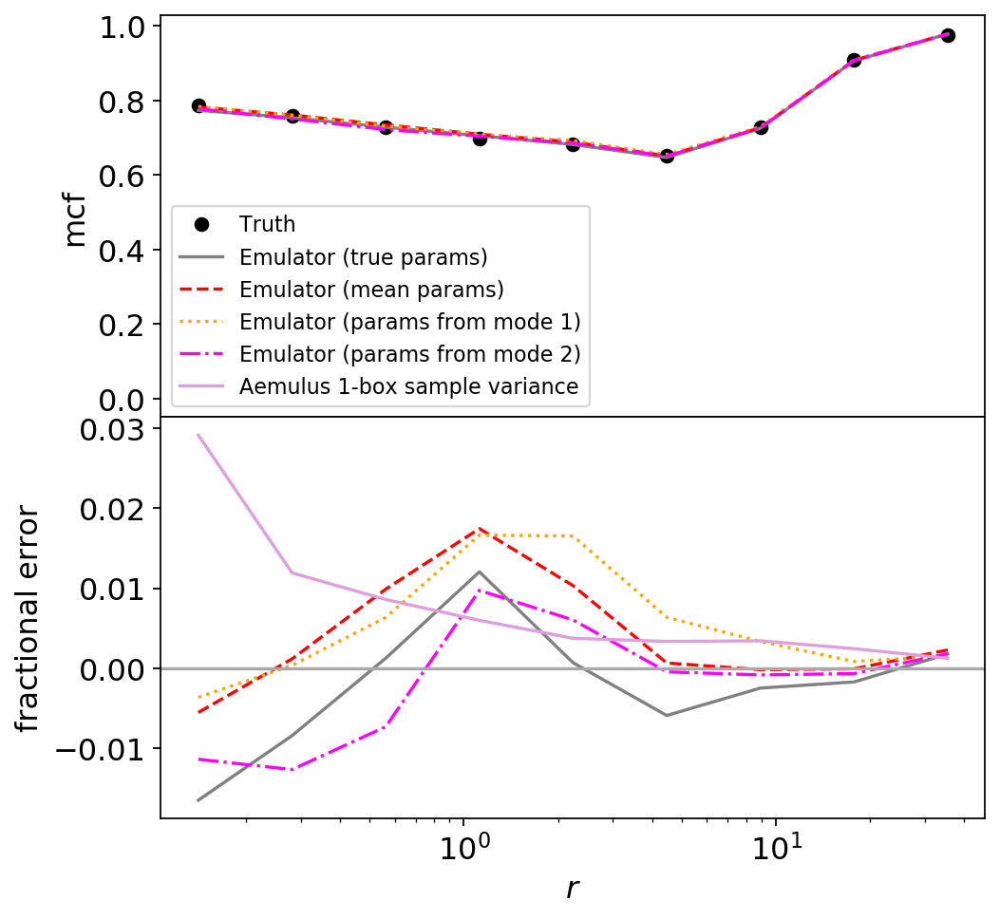

In [96]:
fit_labels = ['Emulator (true params)', 'Emulator (mean params)', 
              'Emulator (params from mode 1)', 'Emulator (params from mode 2)']
fit_colors = ['grey', 'red', 'orange', 'magenta']
plot_fits(statistics, vals_arr_all, vals_true_all, gperrs, fit_labels, fit_colors, title=chaintag)

# fits with just wp

In [110]:
chaintag = 'wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg'
res = load_res(chaintag)
true_params = get_true_params(chaintag)
mean_params = get_mean_params(res)

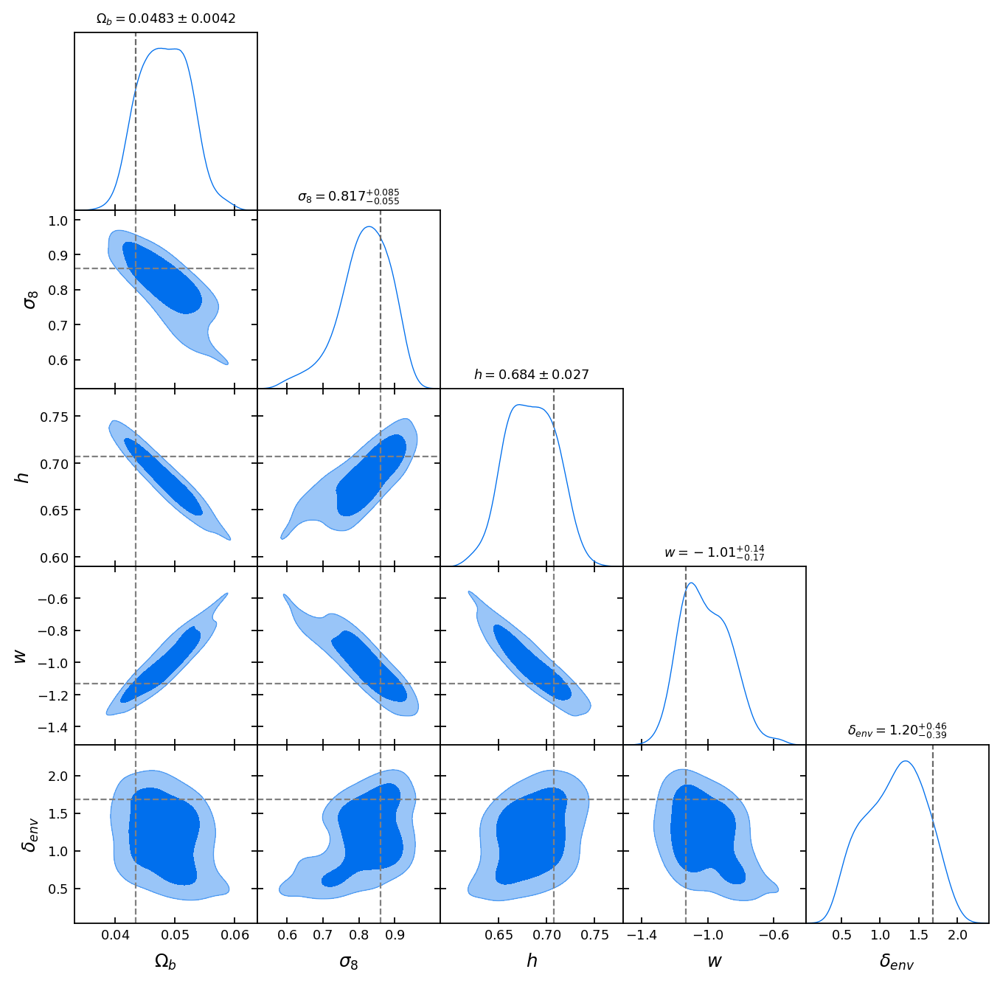

In [75]:
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=true_params, vertical_marker_color='grey')

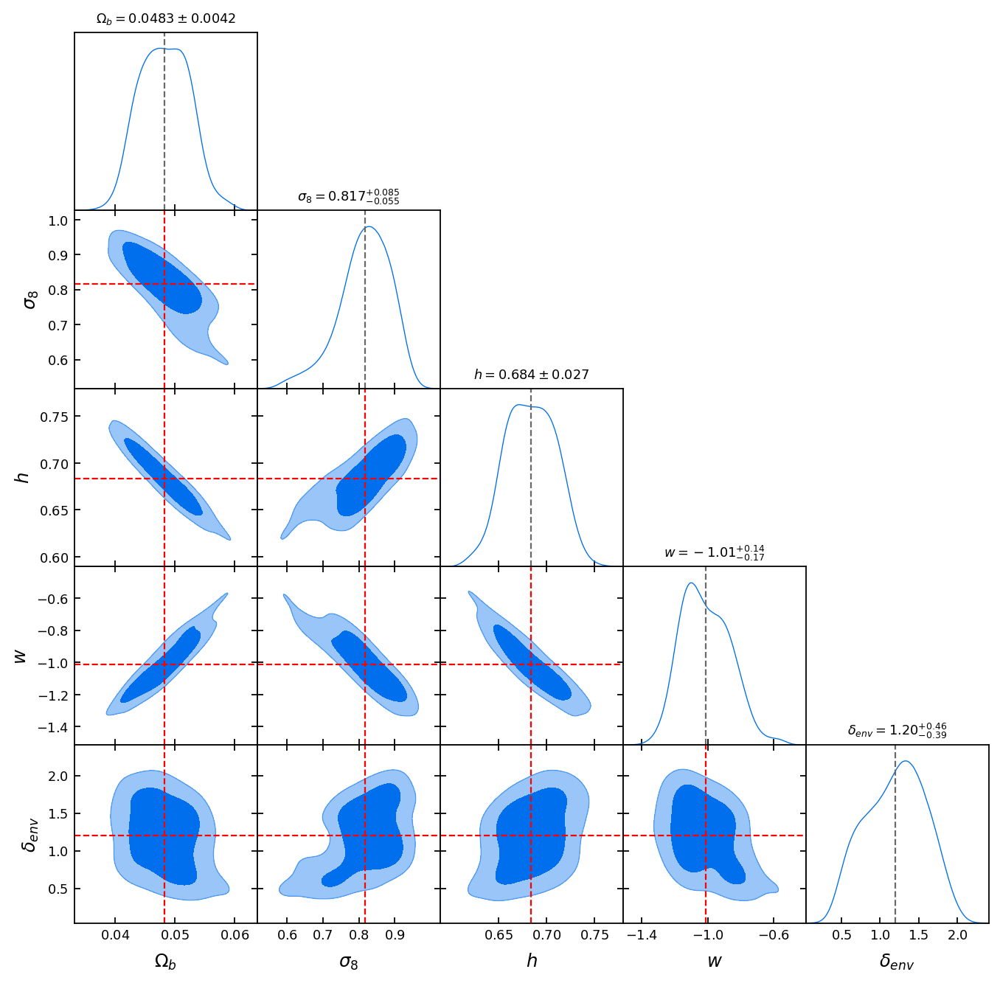

In [76]:
plot_contours_dynesty([chaintag], params_toplot=bi_params, 
                      vertical_markers=mean_params, vertical_marker_color='red')

In [ ]:
param_arr = [true_params, mean_params]
statistics, vals_arr_all, vals_true_all, gperrs = get_fits(chaintag, param_arr)

Building emulators
Rebuilding emulator for wp


In [ ]:
fit_labels = ['Emulator (true params)', 'Emulator (mean params)', 
              ]
fit_colors = ['grey', 'red']
plot_fits(statistics, vals_arr_all, vals_true_all, gperrs, fit_labels, fit_colors, title=chaintag)

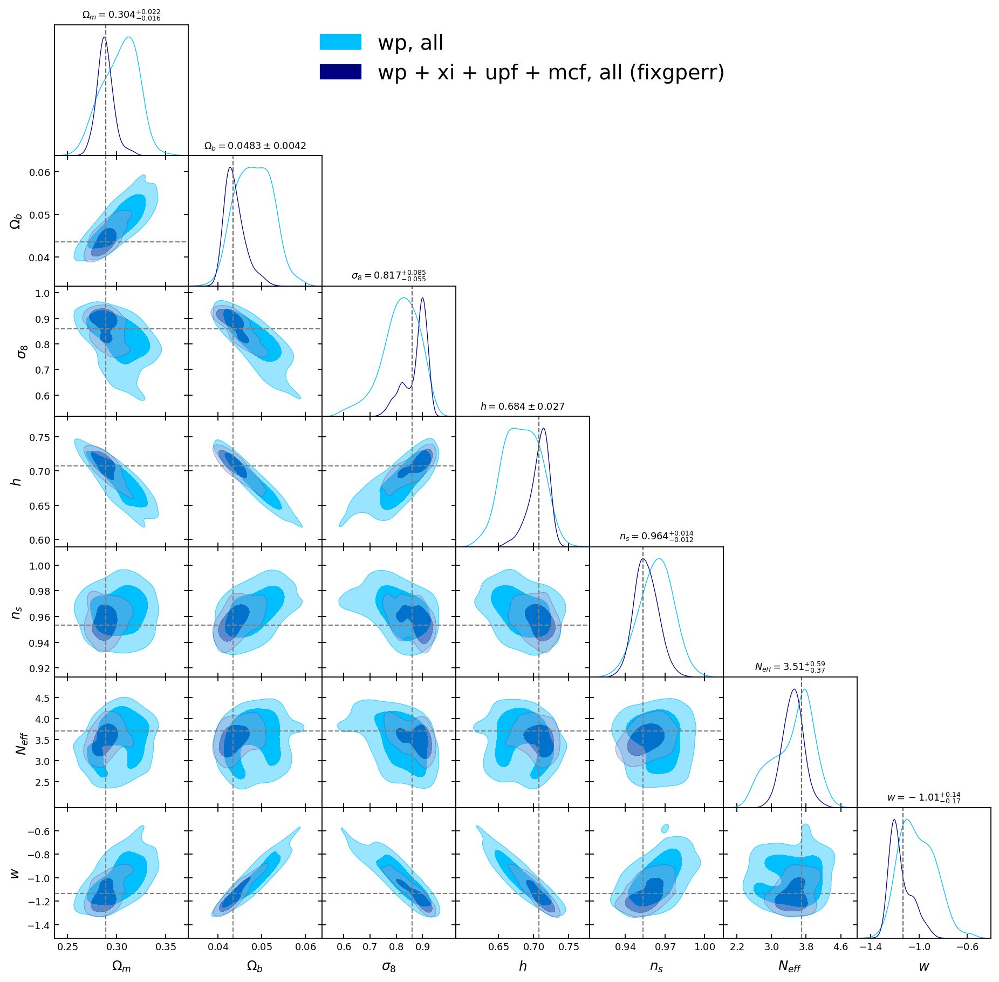

In [80]:
chaintags = ['wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex2',
             ]
legend_labels = ['wp, all',
                 'wp + xi + upf + mcf, all (fixgperr)',
                ]
colors = [cwp, 
          'navy'
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=cosmo_params)

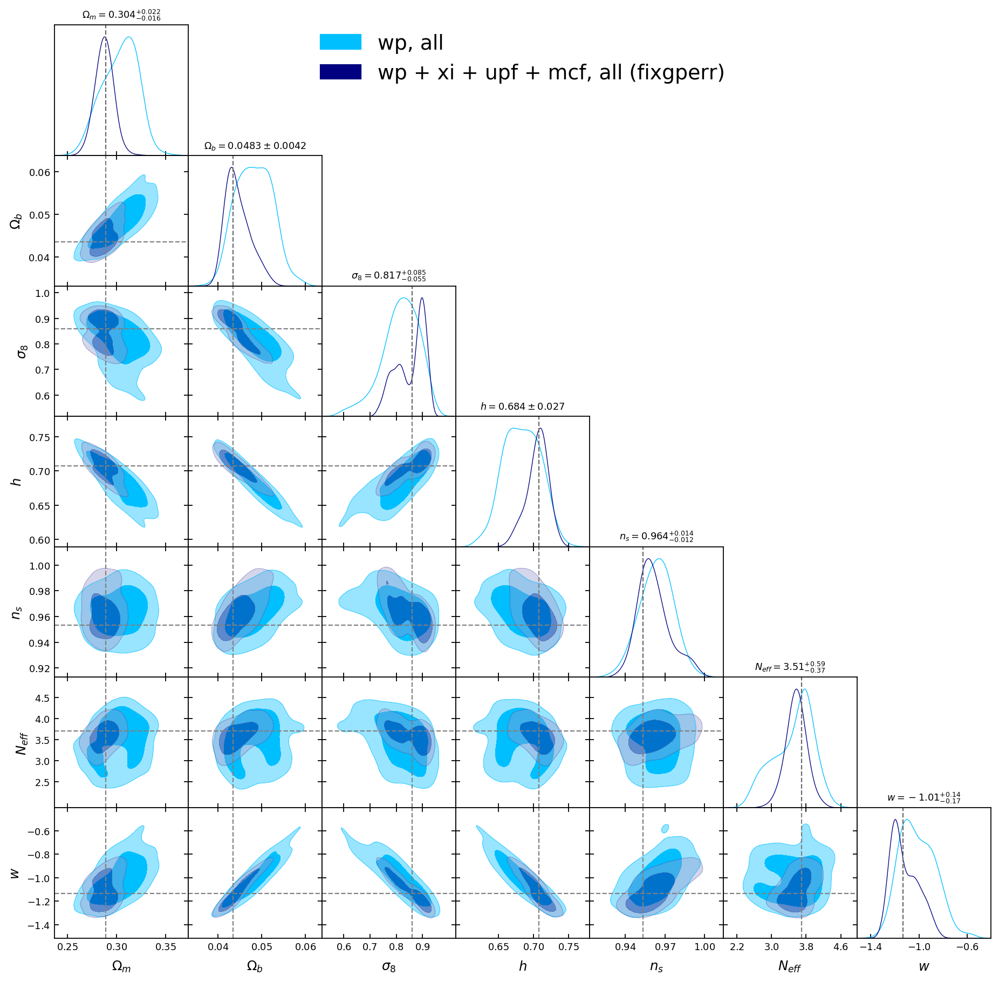

In [20]:
chaintags = ['wp_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr',
             ]
legend_labels = ['wp, all',
                 'wp + xi + upf + mcf, all (fixgperr)',
                ]
colors = [cwp, 
          'navy'
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=cosmo_params)

In [ ]:
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr',
            ]
legend_labels = ['wp + xi + upf + mcf, all, orig',
                 'wp + xi + upf + mcf, all, fixgperr',
                ]
colors = [cwp, 
          'red',
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=biplus_params)

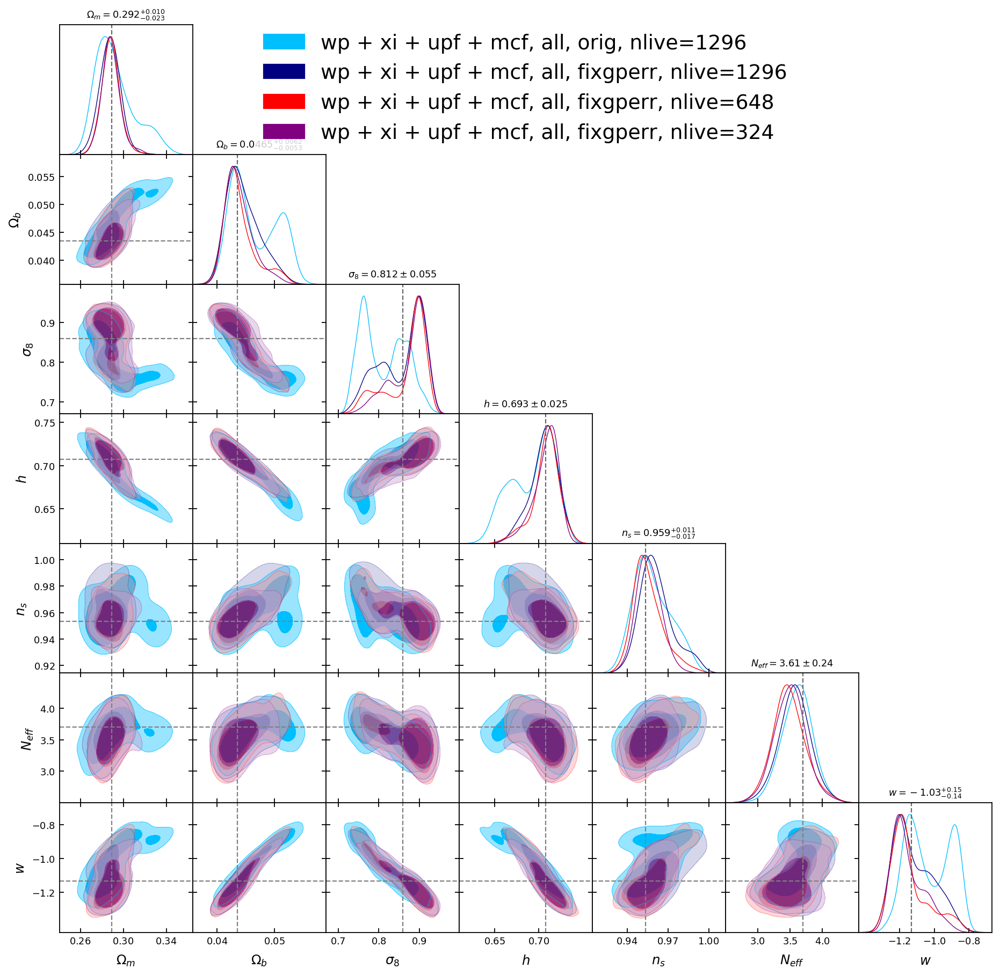

In [21]:
chaintags = ['wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex1',
             'wp_xi_upf_mcf_c3h3_all_dynesty_dlogz1e-2_nongen_hpriorg_fixgperr_nlivex2',
            ]
legend_labels = ['wp + xi + upf + mcf, all, orig, nlive=1296',
                 'wp + xi + upf + mcf, all, fixgperr, nlive=1296',
                 'wp + xi + upf + mcf, all, fixgperr, nlive=648',
                 'wp + xi + upf + mcf, all, fixgperr, nlive=324',
                ]
colors = [cwp, 
          'navy',
          'red',
          'purple',
         ]
plot_contours_dynesty(chaintags, legend_labels=legend_labels,
                      colors=colors, params_toplot=cosmo_params)